In [1]:
%matplotlib inline
%pylab
%load_ext autoreload
%autoreload 2
%matplotlib notebook
%config InlineBackend.figure_format='retina'

import numpy as np
import os
from matplotlib import pyplot as plt
import seaborn as sns
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

from Xana import Xana
from Xana.misc.makemask import masker
from matplotlib.colors import LogNorm
from Xana import Soq

from glob import glob
from Xana import CorrFunc
from Xana.Xfit.fitg2global import G2
from Xana.Xfit.fit_basic import fit_basic
from Xana.misc.add_colorbar import add_colorbar
import configparser

import pandas as pd
import pickle
import h5py

Using matplotlib backend: <object object at 0x2ad51aa0a8a0>
%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
pwd

'/asap3/petra3/gpfs/p10/2022/data/11014696/processed/maddalena/01-notebooks'

In [3]:
ls ../06-scripts

plots.py  __pycache__/  xana_tools.py


# Functions

In [4]:
def plot_ttcs(ind_xpcs, vmin=None, vmax=None, title=False):
    """This functions plots the two-time correlation functions.
    
    Args:
        ind_xpcs (int): database index.
        vmin (float): minimum of colormap passed to imshow.
        vmax (flaot): maximum of colormap passed to imshow.
    
    """
    tmp = d.get_item(ind_xpcs)

    ttcs = tmp['twotime_corf'] # list from 0 to 20: len=21
    ttcxy = tmp['twotime_xy'] # shape (5000,)
    del tmp

    nttcs = len(ttcs.keys()) # 21: number of qs or rois
    nttcs = (nttcs // 2) * 2 # 20

    # shape qv_phi:  (21, 2)
    nq = len(np.unique(qv_phi[:nttcs,0])) # 20
    nangles = len(np.unique(qv_phi[:nttcs,1])) # 1

    condition = nq <= nangles # False

#     ncols = 2
#     nrows = 3
    ncols = nangles - 1
    nrows = nq // ncols 
    nrows = nq if condition else nangles #1
    ncols = nangles if condition else nq #20

    fig, axs = plt.subplots(int(nrows), int(ncols), figsize=(int(2*ncols),int(2*nrows)), constrained_layout=True)
    axs = np.array(axs)
    axs = np.ravel(axs.T) if condition else np.ravel(axs)

    for i, (ind, a) in enumerate(zip(ttcs.keys(), axs)):
        #print(i, ind, a, axs)
        im = a.imshow(ttcs[ind], origin='lower', cmap='inferno', 
                      extent=[ttcxy[0], ttcxy[-1]]*2, vmin=vmin, vmax=vmax)
        q, angle = qv_phi[i]
        a.set_title(f'$\phi={angle:.0f}\,\mathrm{{deg}}$ \n$q={q:.3f}\,\mathrm{{nm}}^{{-1}}$', fontsize=8)
        a.set_xlabel('$t_1\,(\mathrm{s})$', size=10)
        a.set_xlabel('$t_2\,(\mathrm{s})$', size=10)
        if ((i < 2) and not condition) or (condition and i % ncols == 0):
#         if i in [0,5]:
            cb = plt.colorbar(im, ax=a, shrink=.8, aspect=50,)
            cb.ax.tick_params(labelsize=8) 
        a.minorticks_on()
        a.tick_params(which='major', labelsize=8)
    if title: fig.suptitle(title)

# Elog

In [5]:
elog = pd.read_pickle("../02-sources/elog")

In [6]:
elog.columns

Index(['Run n', 'Sample', 'Sample no. (label)', 'folder', 'scan number',
       'Short comment', 'cooling rate (K/min)', 'Target temperature (K)',
       'Detector', 'Beam size (um)', '# Si absorber (25um each)',
       'transmission', 'Exposure time per frame (s)', 'number of frames',
       'Total exposure time (s)', 'Mesh (spots x lines)', 'comments'],
      dtype='object')

In [7]:
elog[elog['folder'].str.contains('HydLys_0p25_2', na=False) & (elog['# Si absorber (25um each)']==6)]

,Run n,Sample,Sample no. (label),folder,scan number,Short comment,cooling rate (K/min),Target temperature (K),Detector,Beam size (um),# Si absorber (25um each),transmission,Exposure time per frame (s),number of frames,Total exposure time (s),Mesh (spots x lines),comments
557,448,hyd lys h0.25,1.1,HydLys_0p25_2_00003,NaN,fluences,NaN,290,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
559,450,hyd lys h0.25,1.1,HydLys_0p25_2_00005,NaN,temperatures epseries,NaN,280,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
560,451,hyd lys h0.25,1.1,HydLys_0p25_2_00006,NaN,temperatures epseries,NaN,270,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
561,452,hyd lys h0.25,1.1,HydLys_0p25_2_00007,NaN,temperatures epseries,NaN,260,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
562,453,hyd lys h0.25,1.1,HydLys_0p25_2_00008,NaN,temperatures epseries,NaN,250,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
563,454,hyd lys h0.25,1.1,HydLys_0p25_2_00009,NaN,temperatures epseries,NaN,240,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
564,455,hyd lys h0.25,1.1,HydLys_0p25_2_00010,NaN,temperatures epseries,NaN,230,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
565,456,hyd lys h0.25,1.1,HydLys_0p25_2_00011,NaN,temperatures epseries,NaN,220,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
566,457,hyd lys h0.25,1.1,HydLys_0p25_2_00012,NaN,temperatures epseries,NaN,210,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
567,458,hyd lys h0.25,1.1,HydLys_0p25_2_00013,NaN,temperatures epseries,NaN,200,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN


# Measurement details

In [8]:
d = Xana()
d.load_db('../05-analysis-phis/analysis_database.pkl')

Try loading database:
	/asap3/petra3/gpfs/p10/2022/data/11014696/processed/maddalena/05-analysis-phis/analysis_database.pkl
Successfully loaded database


In [9]:
sample = 'HydLys_0p25_2' # HydLys_0p25_2 or HydLys_0p29_2

## Select

In [10]:
d.db.index.values

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69])

In [11]:
# run_series = 6
inds_xpcs = d.db[(d.db['sample'] == sample) 
#            & (d.db['series']==run_series) 
           & (d.db['analysis']=='xpcs')
            & (d.db.index.values > 6 )
            & (d.db['series'] != 4 )
                 & (d.db.index.values < 64 )
               ].index.values
display(d.db.loc[inds_xpcs])

,use,sample,analysis,series,subset,t_delay,t_exposure,t_readout,nframes,first,last,master,datdir,mod,savname,savfile,setupfile,comment
8,True,HydLys_0p25_2,xpcs,3,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-08 16:59:57.259642,s0003_0008.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
12,True,HydLys_0p25_2,xpcs,6,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-09 11:33:02.849864,s0006_0012.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
14,True,HydLys_0p25_2,xpcs,7,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-09 11:50:31.153889,s0007_0014.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
16,True,HydLys_0p25_2,xpcs,8,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-09 11:59:38.512371,s0008_0016.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
18,True,HydLys_0p25_2,xpcs,9,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-09 12:12:29.668986,s0009_0018.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
20,True,HydLys_0p25_2,xpcs,11,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-09 13:24:19.751151,s0011_0020.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
22,True,HydLys_0p25_2,xpcs,12,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-09 14:53:03.452805,s0012_0022.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
24,True,HydLys_0p25_2,xpcs,5,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-10 10:36:05.747061,s0005_0024.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
26,True,HydLys_0p25_2,xpcs,10,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-10 10:42:45.158643,s0010_0026.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
28,True,HydLys_0p25_2,xpcs,13,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-10 10:59:48.300439,s0013_0028.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,


**Select measurements**

In [12]:
series_n = d.db.loc[inds_xpcs, 'series'].values
inds_xpcs_sorted = [x for _,x in sorted(zip(series_n, inds_xpcs))]

In [13]:
# inds_xpcs_sorted = inds_xpcs_sorted[:-1]
# sample = d.db.loc[ind_xpcs, 'sample']
# series = d.db.loc[ind_xpcs, 'series']

### Load setup

In [14]:
detector = 'eiger4m'
# setupfile = d.db.loc[inds_xpcs_sorted[5], 'setupfile']
setupfile = d.db.loc[inds_xpcs_sorted[1], 'setupfile']

d = Xana(setupfile=setupfile)
d.load_db('../05-analysis-phis/analysis_database.pkl')

Loaded setupfile:
	/asap3/petra3/gpfs/p10/2022/data/11014696/processed/maddalena/04-setups/setup-HydLys_0p25_2_00005_dbid00-phis.pkl.
Try loading database:
	/asap3/petra3/gpfs/p10/2022/data/11014696/processed/maddalena/05-analysis-phis/analysis_database.pkl
Successfully loaded database


### Show mask and rois

<IPython.core.display.Javascript object>


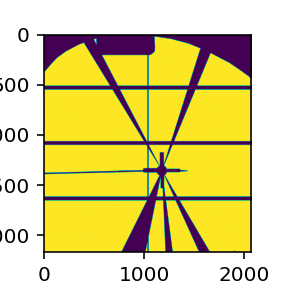

In [15]:
plt.figure(figsize=(2,2))
plt.imshow(d.setup.mask);

# Transmissions

In [16]:
# old beamtime
Tr = np.array([1, 0.74, 0.55, 0.2, 0.09])
Flux = 4e9 #ph/s
beam = np.pi*30*30 # um^2

F = Tr*Flux # ph/s
Fl = Tr*Flux/beam # ph/s/um^2

print("Transm \t Flux (ph/s) \t Fluence (ph/s/um^2)")
for i in range(len(Tr)):
    print(f'{Tr[i]} \t {F[i]:.1e} \t {Fl[i]:.1e}')

Transm 	 Flux (ph/s) 	 Fluence (ph/s/um^2)
1.0 	 4.0e+09 	 1.4e+06
0.74 	 3.0e+09 	 1.0e+06
0.55 	 2.2e+09 	 7.8e+05
0.2 	 8.0e+08 	 2.8e+05
0.09 	 3.6e+08 	 1.3e+05


In [17]:
# new beamtime
Tr = np.array([1, 0.47, 0.215, 0.1])

Flux = 6e9 #ph/s
beam = np.pi*30*30 # um^2

F = Tr*Flux # ph/s
Fl = Tr*Flux/beam # ph/s/um^2

print("Transm \t Flux (ph/s) \t Fluence (ph/s/um^2)")
for i in range(len(Tr)):
    print(f'{Tr[i]} \t {F[i]:.1e} \t {Fl[i]:.1e}')

Transm 	 Flux (ph/s) 	 Fluence (ph/s/um^2)
1.0 	 6.0e+09 	 2.1e+06
0.47 	 2.8e+09 	 1.0e+06
0.215 	 1.3e+09 	 4.6e+05
0.1 	 6.0e+08 	 2.1e+05


# plots

In [18]:
phi = d.setup.phiv
print(f'angles array: {phi}')
phi = phi[:,0] + phi[:,1]/2
print(f'angles vector: {phi}')
qv = d.setup.qv
print(f'q-vector: {qv}')

qv_phi = np.zeros((len(qv), 2))
qv_phi[:,0] = qv
i0 = 0
for i1 in np.unique(qv, return_counts=True)[1]:
    qv_phi[i0:i0+i1,1] = phi[:i1]
    i0 += i1

nangles = len(phi) # number of unqiue angles
nq = len(np.unique(qv)) # number of unique q-values

angles array: [[-22.5  45. ]
 [ 67.5  45. ]]
angles vector: [ 0. 90.]
q-vector: [0.05 0.05 0.1  0.1  0.15 0.15]


# Plot TTCs

In [19]:
series_ns = d.db.loc[inds_xpcs_sorted, 'series'].values
series_ns

array([3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], dtype=object)

In [20]:
sub_elog = elog[(elog['folder'].str.contains(f'{sample}', na=False)) & (elog['# Si absorber (25um each)']==6)]
sub_elog

,Run n,Sample,Sample no. (label),folder,scan number,Short comment,cooling rate (K/min),Target temperature (K),Detector,Beam size (um),# Si absorber (25um each),transmission,Exposure time per frame (s),number of frames,Total exposure time (s),Mesh (spots x lines),comments
557,448,hyd lys h0.25,1.1,HydLys_0p25_2_00003,NaN,fluences,NaN,290,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
559,450,hyd lys h0.25,1.1,HydLys_0p25_2_00005,NaN,temperatures epseries,NaN,280,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
560,451,hyd lys h0.25,1.1,HydLys_0p25_2_00006,NaN,temperatures epseries,NaN,270,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
561,452,hyd lys h0.25,1.1,HydLys_0p25_2_00007,NaN,temperatures epseries,NaN,260,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
562,453,hyd lys h0.25,1.1,HydLys_0p25_2_00008,NaN,temperatures epseries,NaN,250,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
563,454,hyd lys h0.25,1.1,HydLys_0p25_2_00009,NaN,temperatures epseries,NaN,240,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
564,455,hyd lys h0.25,1.1,HydLys_0p25_2_00010,NaN,temperatures epseries,NaN,230,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
565,456,hyd lys h0.25,1.1,HydLys_0p25_2_00011,NaN,temperatures epseries,NaN,220,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
566,457,hyd lys h0.25,1.1,HydLys_0p25_2_00012,NaN,temperatures epseries,NaN,210,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN
567,458,hyd lys h0.25,1.1,HydLys_0p25_2_00013,NaN,temperatures epseries,NaN,200,NaN,30x30,6.0,NaN,"0,5",2000.0,1000,NaN,NaN


In [21]:
T = np.array(sub_elog['Target temperature (K)'].values, dtype=int)
T

array([290, 280, 270, 260, 250, 240, 230, 220, 210, 200, 190, 180])

<IPython.core.display.Javascript object>


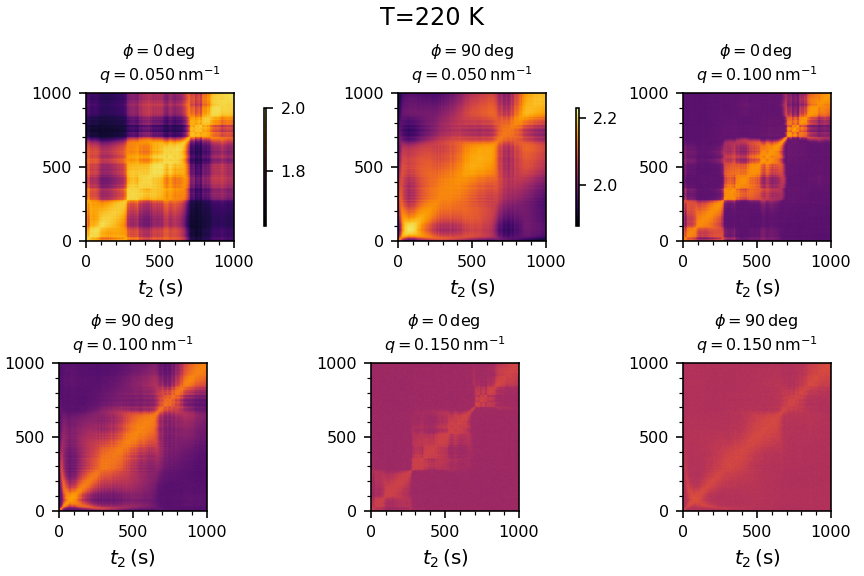

In [22]:
ind = 7
plot_ttcs(inds_xpcs_sorted[ind], title=f'T={T[ind]} K')#, vmin=None, vmax=None)

<IPython.core.display.Javascript object>


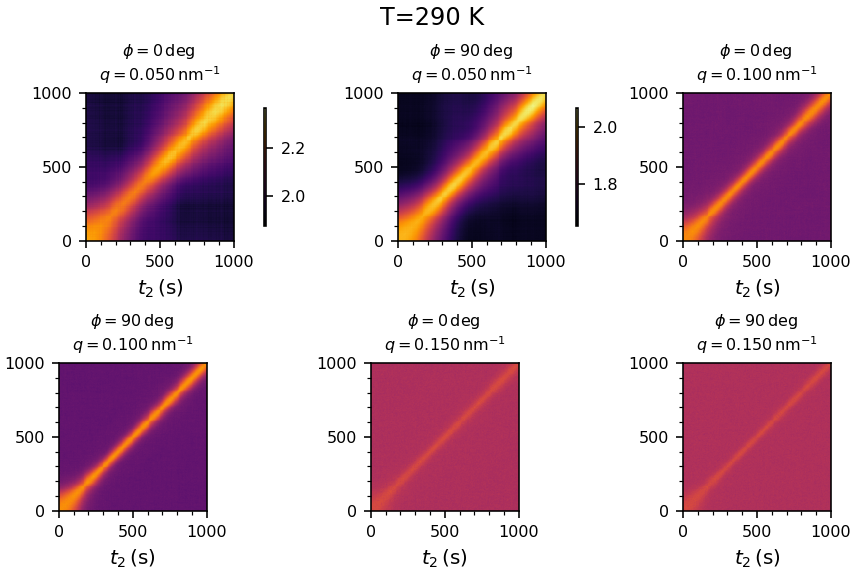

<IPython.core.display.Javascript object>


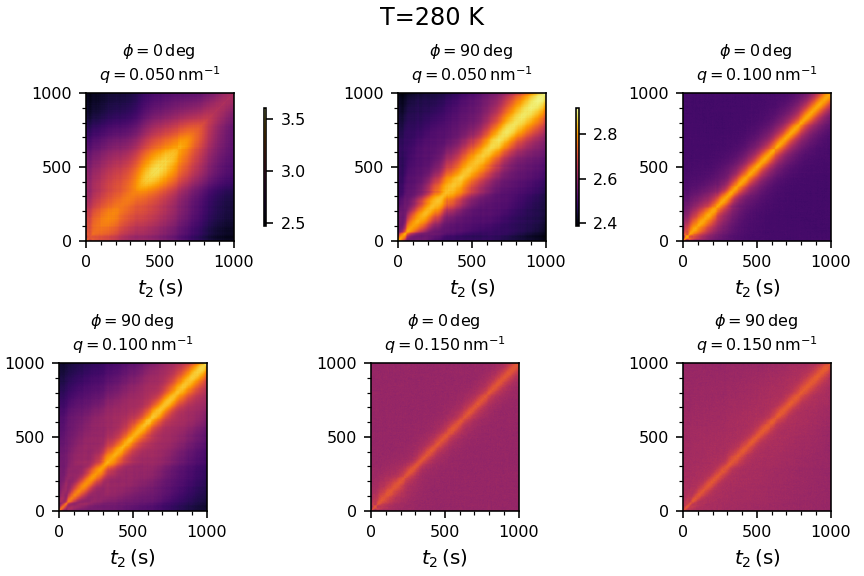

<IPython.core.display.Javascript object>


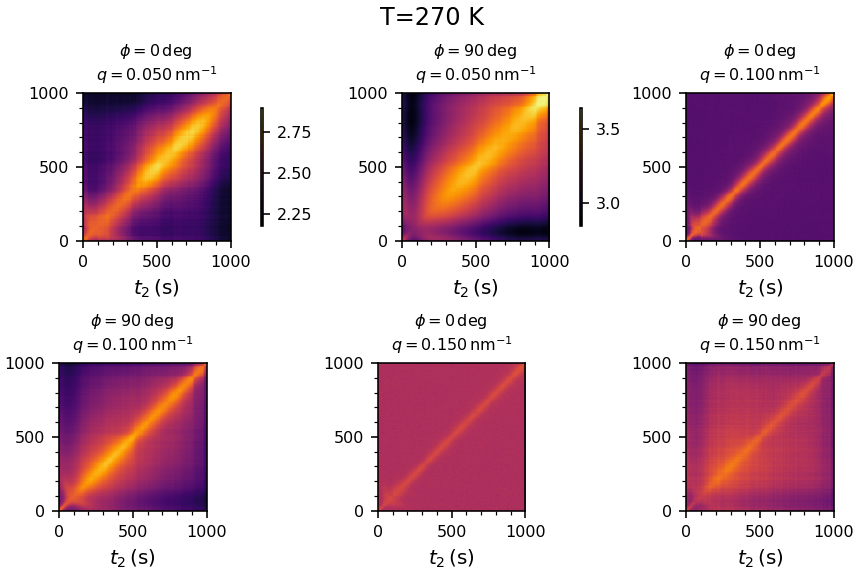

<IPython.core.display.Javascript object>


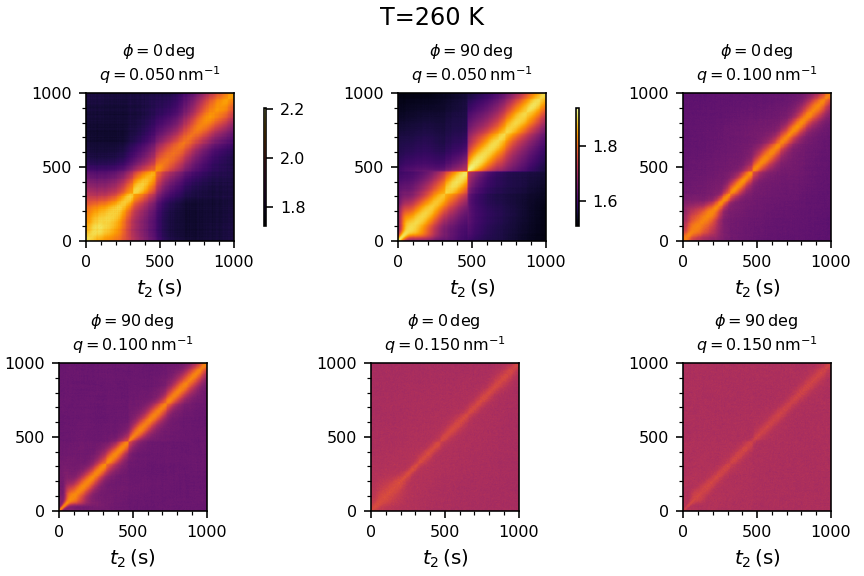

<IPython.core.display.Javascript object>


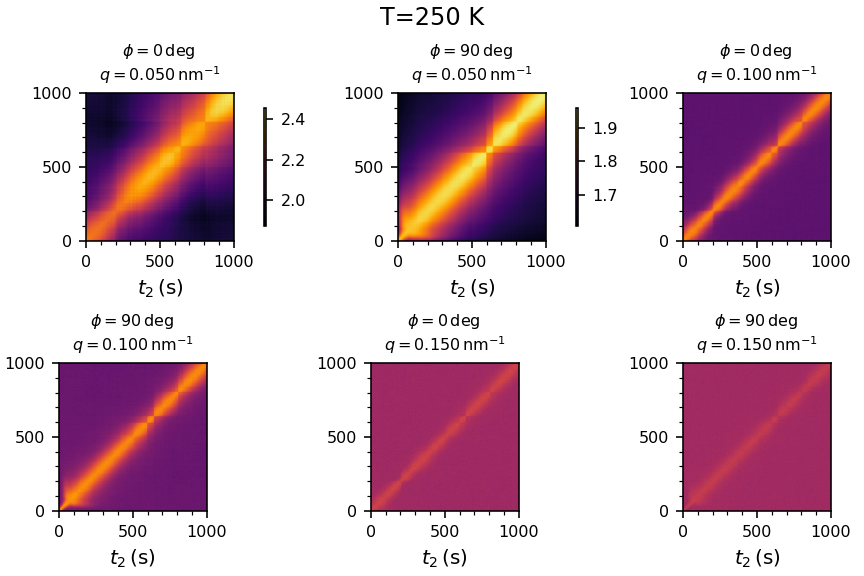

<IPython.core.display.Javascript object>


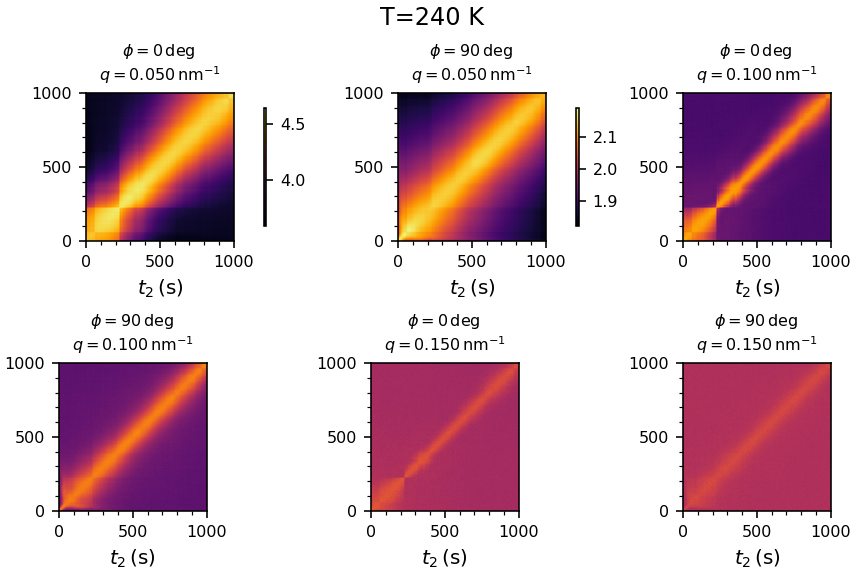

<IPython.core.display.Javascript object>


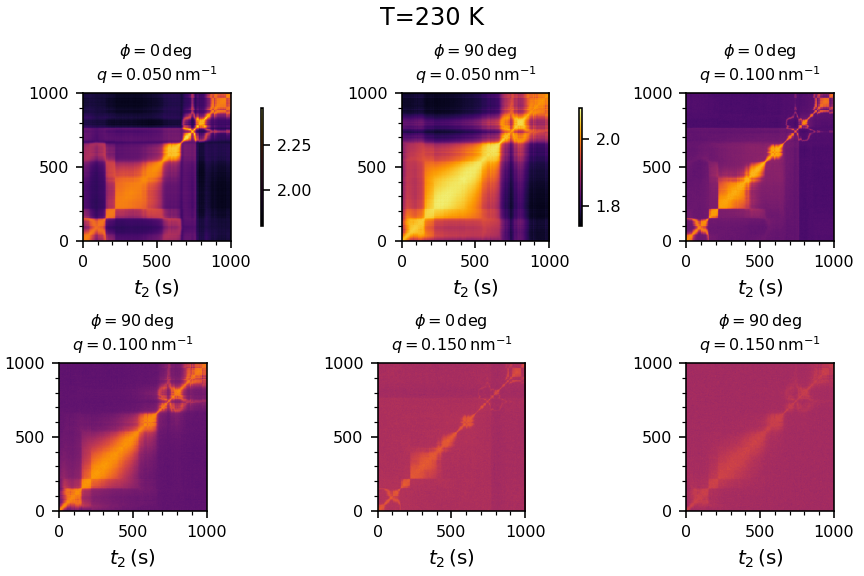

<IPython.core.display.Javascript object>


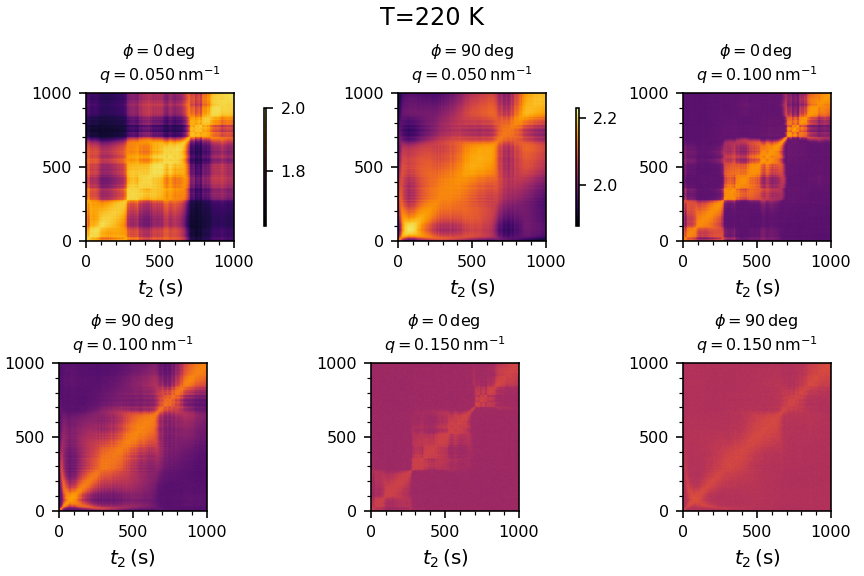

<IPython.core.display.Javascript object>


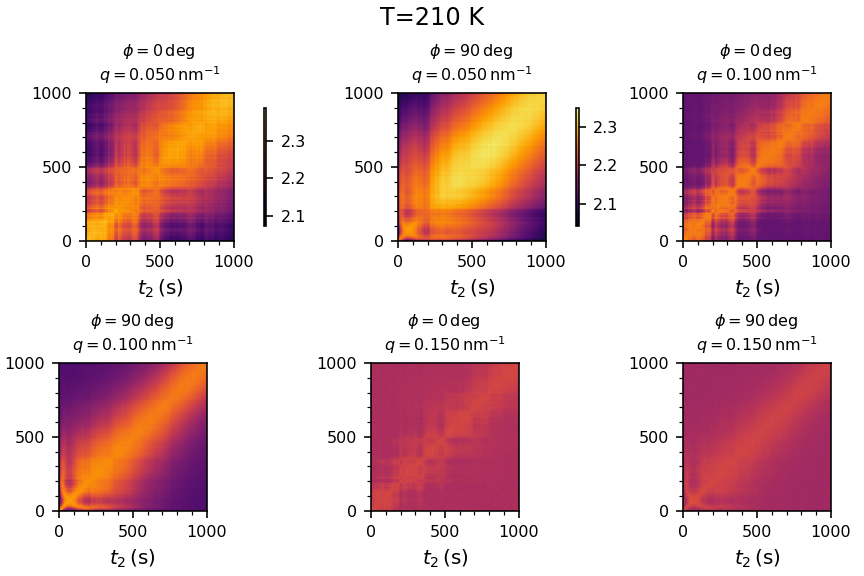

<IPython.core.display.Javascript object>


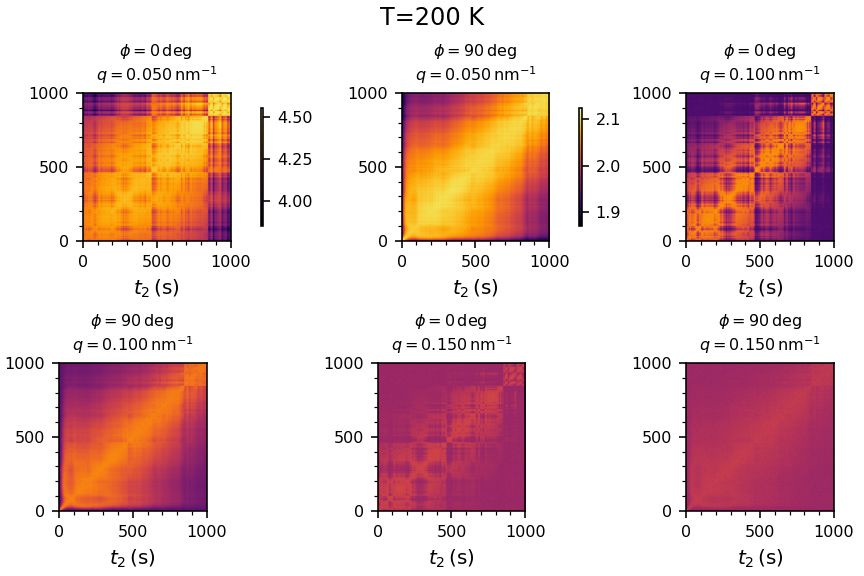

<IPython.core.display.Javascript object>


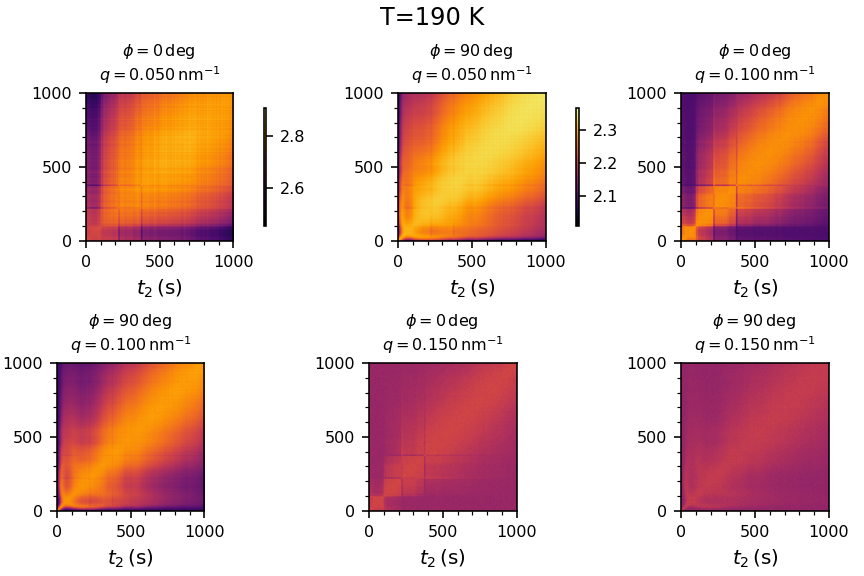

<IPython.core.display.Javascript object>


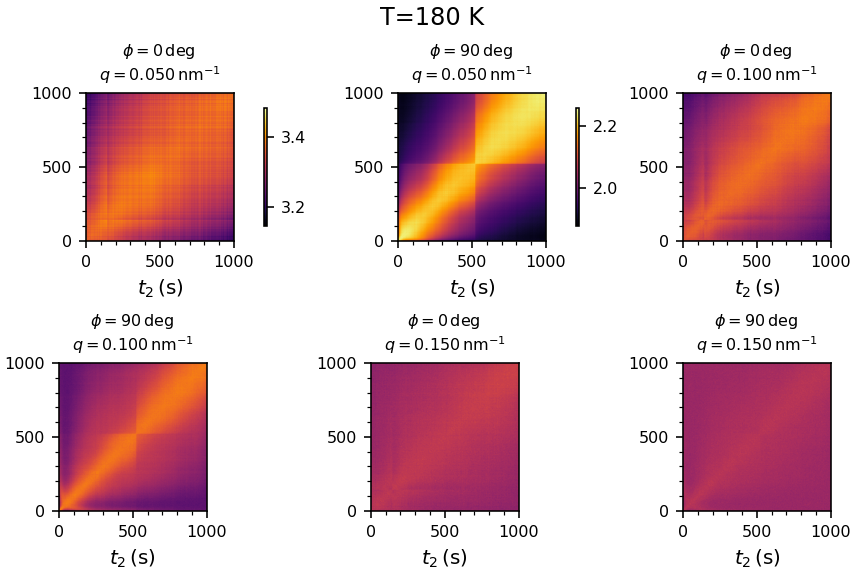

In [23]:
for i,ind in enumerate(inds_xpcs_sorted):
    plot_ttcs(ind, title=f'T={T[i]} K')#, vmin=None, vmax=None)

### Anisotropy

In [24]:
def plot_many_qs(ana, ind_xpcs, nq, nangles, qv_phi, qv, phi, dofit=0, rescale=False, title=None):
    """Create a plot when a setup was used with only 2 angles and several q-bins.
    """
    # Now we use the CorrFunc module
    g = CorrFunc(ana)

    fig, axs = plt.subplots(3, 2, figsize=(6,8), constrained_layout=True, sharex='row', sharey='row')
    axs = np.array(axs).T

    angles_per_q = np.unique(qv, return_counts=True)[1]
    xf = np.logspace(-2,1,100)

    i0 = 0
    for i, (p, ax) in enumerate(zip(phi, axs)):

        a = ax[0]    
        g.get_g2(ind_xpcs, merge='merge')
        g.nq = np.where(np.isclose(qv_phi[:,1], p))[0]
        qv = qv_phi[g.nq, 0]
        if rescale:
            g.rescale(0, interval=(1,-2), norm_contrast=True)
#         g.rescale(interval=(1, -2), norm_contrast=1)
        g.plot_g2(doplot='data_legq_fit', color_mode=1, dofit=dofit, 
                  cmap='viridis', #data='rescaled',
                  ax=a, markersize=5, method='equal',
                  init={"t0":(100, None, None)},
    #               fitglobal=['g0'],
                  fix={"a":1,})

        if dofit: display(g.pars[0])

        a.set_title(f'$\phi={p:.0f}\,\mathrm{{deg}}$')
        
        a = ax[1]
        angles = qv_phi[g.nq,1]
        if dofit:
            a.errorbar(qv, 1/g.pars[0]['t0'], yerr=1/g.pars[0]['t0']**2*g.pars[0]['dt0'], fmt='o', color='tab:blue')
    #     a.set_ylim(0,10)
        a.set_xlabel('$q\,(\mathrm{nm}^{-1})$')
        a.set_ylabel(r'$\Gamma_0\,(\mathrm{s}^{-1})$')

        a = ax[2]
        angles = qv_phi[g.nq,1]
        if dofit:
            a.errorbar(qv, g.pars[0]['g0'], yerr=g.pars[0]['dg0'], fmt='o', color='tab:red')
        a.set_ylim(0,3)
        a.set_xlabel('$q\,(\mathrm{nm}^{-1})$')
        a.set_ylabel(r'$\alpha$')

    for i, a in enumerate(axs.flatten()):
        a.minorticks_on()
        a.tick_params(which='both', right=True, top=True)
        if i//3:
            a.set_ylabel('')
    if title: fig.suptitle(title)

<IPython.core.display.Javascript object>


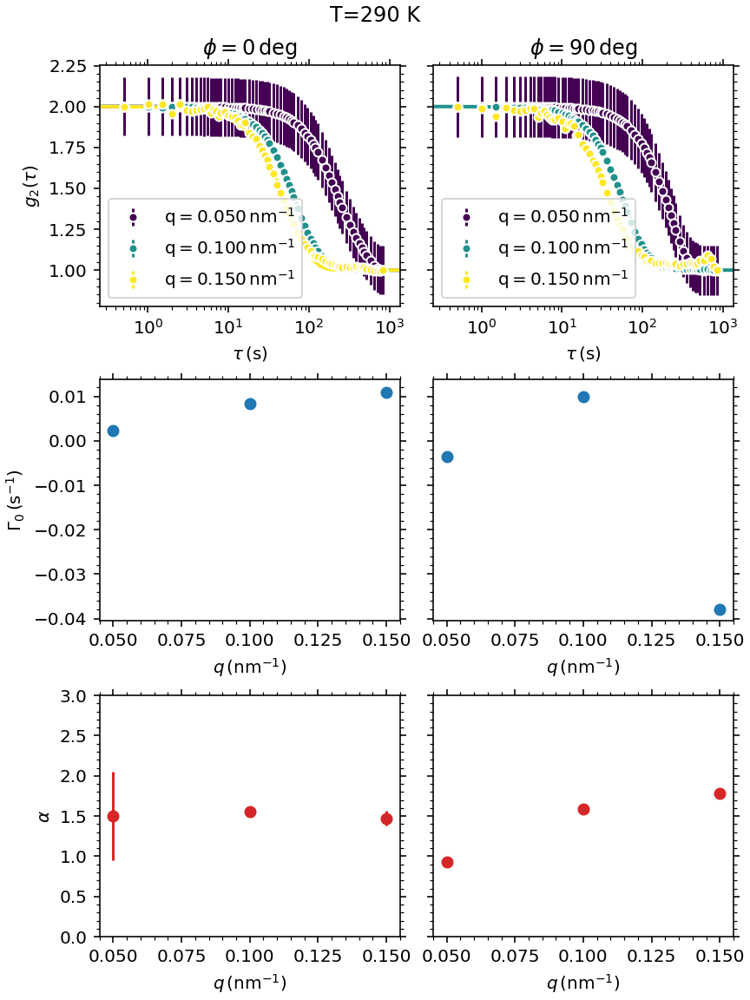

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,432.518340,106.423109,1.503323,0.550340,1.0,0.028775,1,0.0,1.0,0.028775,860.608835,4.281636,344.335804,314.211837
1,0.10,118.680671,1.708686,1.552189,0.037115,1.0,0.000688,1,0.0,1.0,0.000688,860.608835,4.281636,344.335804,314.211837
2,0.15,90.809603,3.286313,1.470956,0.090535,1.0,0.013713,1,0.0,1.0,0.013713,860.608835,4.281636,344.335804,314.211837


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,-278.832371,NaN,0.930755,NaN,0.939349,NaN,1,NaN,0.939349,NaN,46337.692748,230.535785,1181.410698,1151.28673
1,0.10,100.366106,NaN,1.584347,NaN,1.000000,NaN,1,NaN,1.000000,NaN,46337.692748,230.535785,1181.410698,1151.28673
2,0.15,-26.334842,NaN,1.786568,NaN,0.995420,NaN,1,NaN,0.995420,NaN,46337.692748,230.535785,1181.410698,1151.28673


<IPython.core.display.Javascript object>


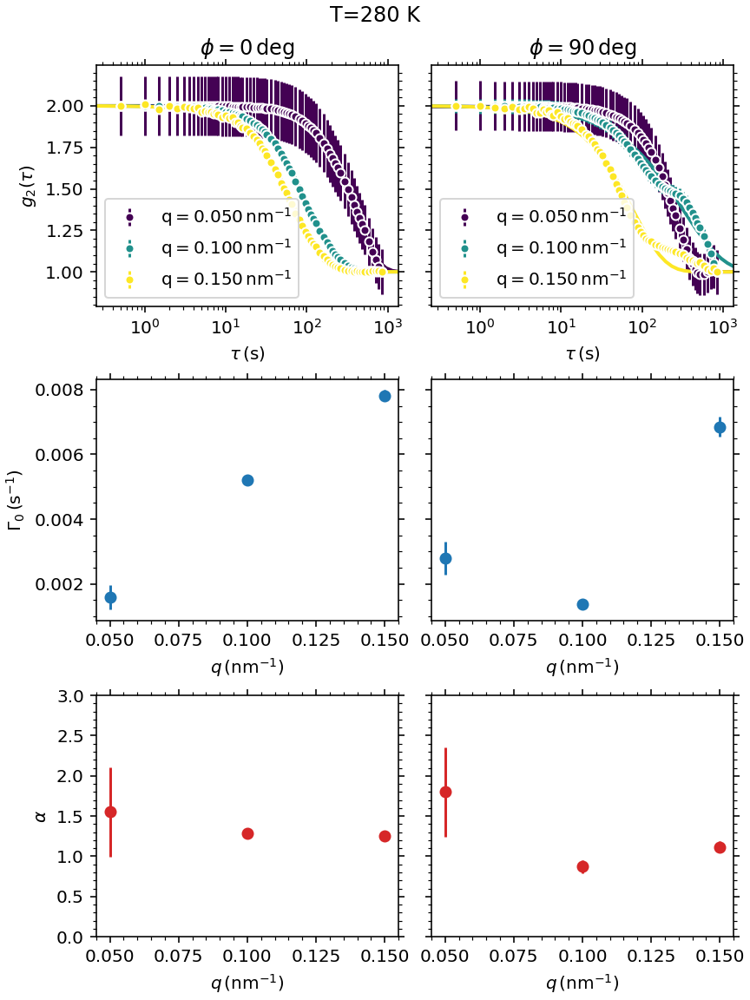

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,630.240371,148.550967,1.550114,0.560986,1.0,0.063515,1,0.0,1.0,0.063515,842.469636,4.191391,339.862287,309.738319
1,0.10,191.609632,2.252018,1.283256,0.021497,1.0,0.004219,1,0.0,1.0,0.004219,842.469636,4.191391,339.862287,309.738319
2,0.15,127.872807,2.670341,1.256606,0.039830,1.0,0.009526,1,0.0,1.0,0.009526,842.469636,4.191391,339.862287,309.738319


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,357.572683,65.851362,1.799587,0.553233,0.995184,0.052750,1,0.0,0.995184,0.052750,767.745322,3.819628,320.35758,290.233612
1,0.10,728.585080,63.818828,0.872132,0.078373,1.000000,0.001842,1,0.0,1.000000,0.001842,767.745322,3.819628,320.35758,290.233612
2,0.15,145.845589,6.672601,1.115781,0.069238,1.000000,0.001422,1,0.0,1.000000,0.001422,767.745322,3.819628,320.35758,290.233612


<IPython.core.display.Javascript object>


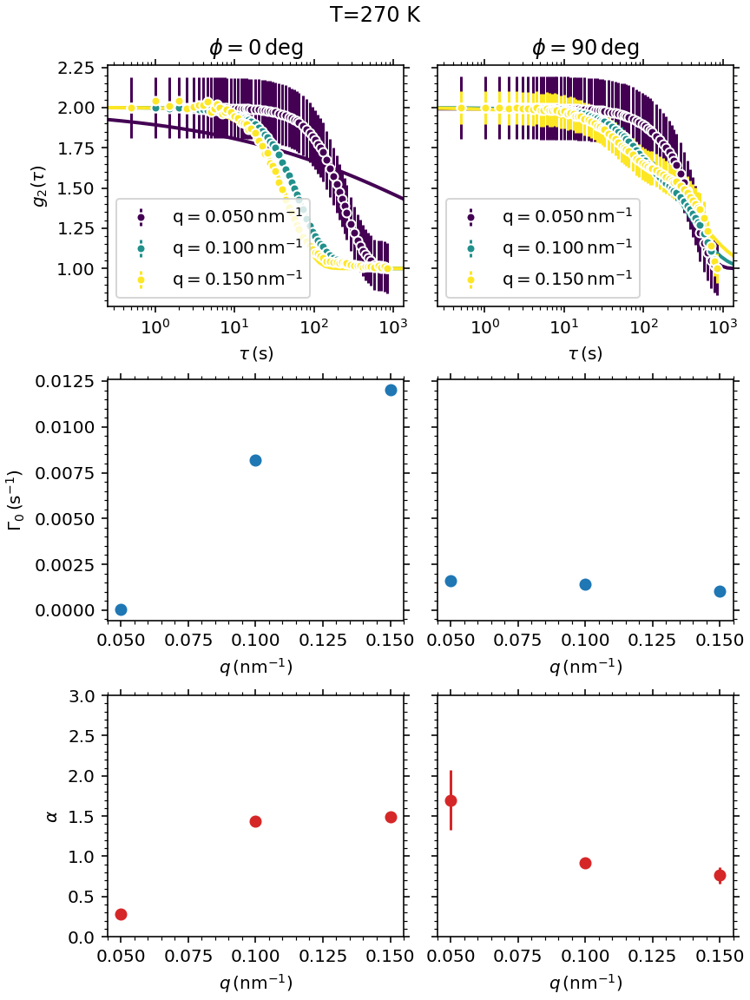

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,30670.379494,NaN,0.277843,NaN,1.000000,NaN,1,NaN,1.000000,NaN,2056.641756,10.232049,527.285627,497.161659
1,0.10,121.900106,NaN,1.433590,NaN,1.000000,NaN,1,NaN,1.000000,NaN,2056.641756,10.232049,527.285627,497.161659
2,0.15,83.316862,NaN,1.494785,NaN,0.999999,NaN,1,NaN,0.999999,NaN,2056.641756,10.232049,527.285627,497.161659


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,622.410728,87.103128,1.701047,0.377342,0.992703,0.035042,1,0.0,0.992703,0.035042,223.087113,1.109886,60.819477,30.695509
1,0.10,711.034256,36.264413,0.923563,0.048482,1.000000,0.000337,1,0.0,1.000000,0.000337,223.087113,1.109886,60.819477,30.695509
2,0.15,985.973415,148.735079,0.763273,0.101053,1.000000,0.008749,1,0.0,1.000000,0.008749,223.087113,1.109886,60.819477,30.695509


<IPython.core.display.Javascript object>


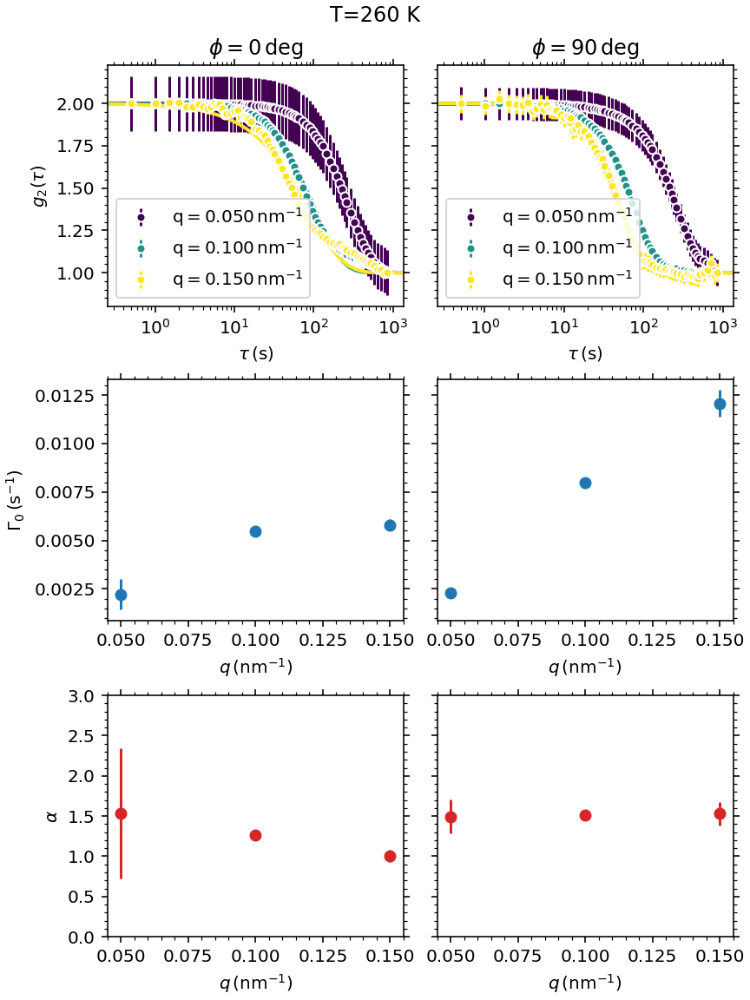

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,450.892939,158.764973,1.532665,0.808834,1.0,0.067477,1,0.0,1.0,0.067477,2191.93373,10.905143,540.664663,510.540696
1,0.10,182.298527,4.522721,1.268910,0.044376,1.0,0.000838,1,0.0,1.0,0.000838,2191.93373,10.905143,540.664663,510.540696
2,0.15,172.561110,8.841961,1.004582,0.070735,1.0,0.015971,1,0.0,1.0,0.015971,2191.93373,10.905143,540.664663,510.540696


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,432.901600,40.745419,1.496003,0.213244,0.997264,0.027977,1,0.0,0.997264,0.027977,466.34547,2.320127,215.665996,185.542028
1,0.10,125.362514,1.997311,1.515274,0.038936,1.000000,0.000483,1,0.0,1.000000,0.000483,466.34547,2.320127,215.665996,185.542028
2,0.15,82.821777,4.645640,1.531998,0.145188,1.000000,0.001795,1,0.0,1.000000,0.001795,466.34547,2.320127,215.665996,185.542028


<IPython.core.display.Javascript object>


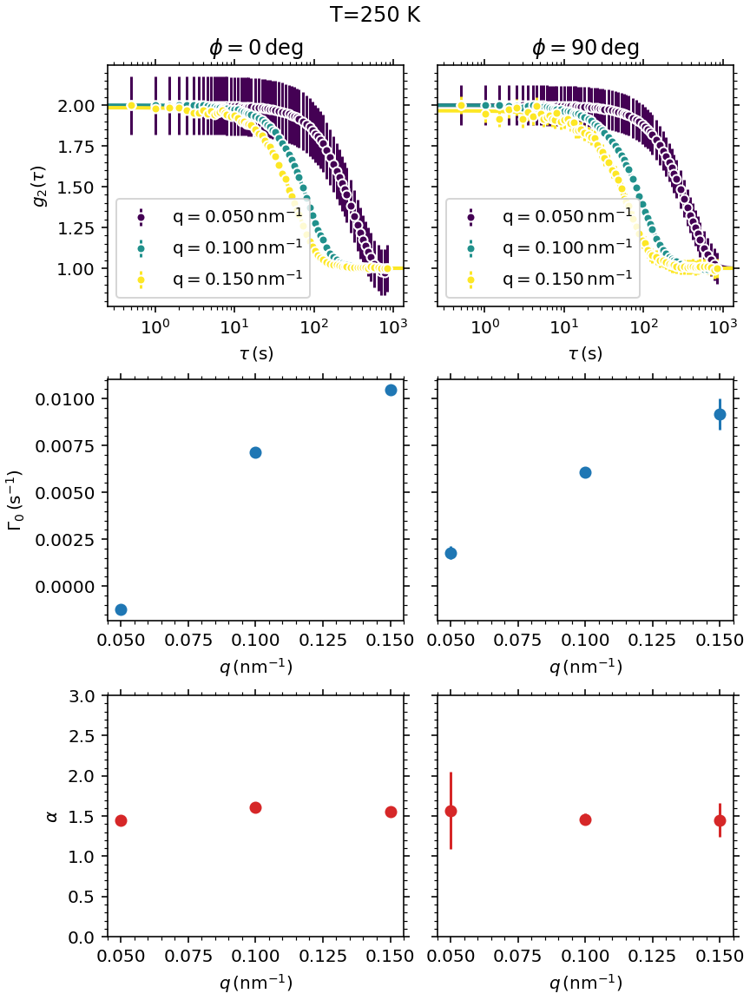

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,-803.232340,NaN,1.446000,NaN,0.929030,NaN,1,NaN,0.929030,NaN,2451.622593,12.197127,564.177513,534.053546
1,0.10,139.846698,NaN,1.606095,NaN,1.000000,NaN,1,NaN,1.000000,NaN,2451.622593,12.197127,564.177513,534.053546
2,0.15,95.716672,NaN,1.550716,NaN,0.984742,NaN,1,NaN,0.984742,NaN,2451.622593,12.197127,564.177513,534.053546


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,559.502407,112.500721,1.570370,0.482149,0.999898,0.124399,1,0.0,0.999898,0.124399,1243.960391,6.188858,421.703027,391.579059
1,0.10,164.468444,4.884234,1.463646,0.066340,1.000000,0.043873,1,0.0,1.000000,0.043873,1243.960391,6.188858,421.703027,391.579059
2,0.15,109.021958,10.044540,1.451675,0.213186,0.965935,0.036371,1,0.0,0.965935,0.036371,1243.960391,6.188858,421.703027,391.579059


<IPython.core.display.Javascript object>


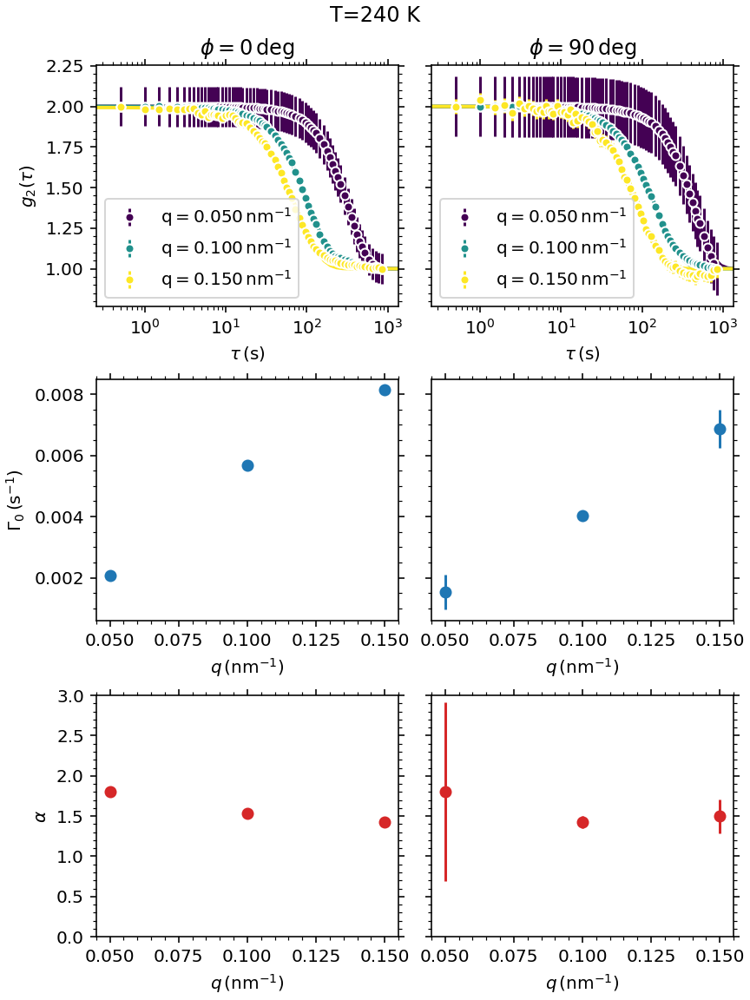

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,483.806748,NaN,1.799910,NaN,1.000000,NaN,1,NaN,1.000000,NaN,705.78111,3.511349,302.685467,272.561499
1,0.10,176.080637,NaN,1.533624,NaN,1.000000,NaN,1,NaN,1.000000,NaN,705.78111,3.511349,302.685467,272.561499
2,0.15,123.004094,NaN,1.425653,NaN,0.993373,NaN,1,NaN,0.993373,NaN,705.78111,3.511349,302.685467,272.561499


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,652.156462,242.939487,1.799993,1.112192,0.998774,0.093098,1,0.0,0.998774,0.093098,1841.737258,9.162872,504.108945,473.984978
1,0.10,248.161672,9.113521,1.424115,0.075722,1.000000,0.011301,1,0.0,1.000000,0.011301,1841.737258,9.162872,504.108945,473.984978
2,0.15,145.702715,13.101833,1.496269,0.212506,1.000000,0.033605,1,0.0,1.000000,0.033605,1841.737258,9.162872,504.108945,473.984978


<IPython.core.display.Javascript object>


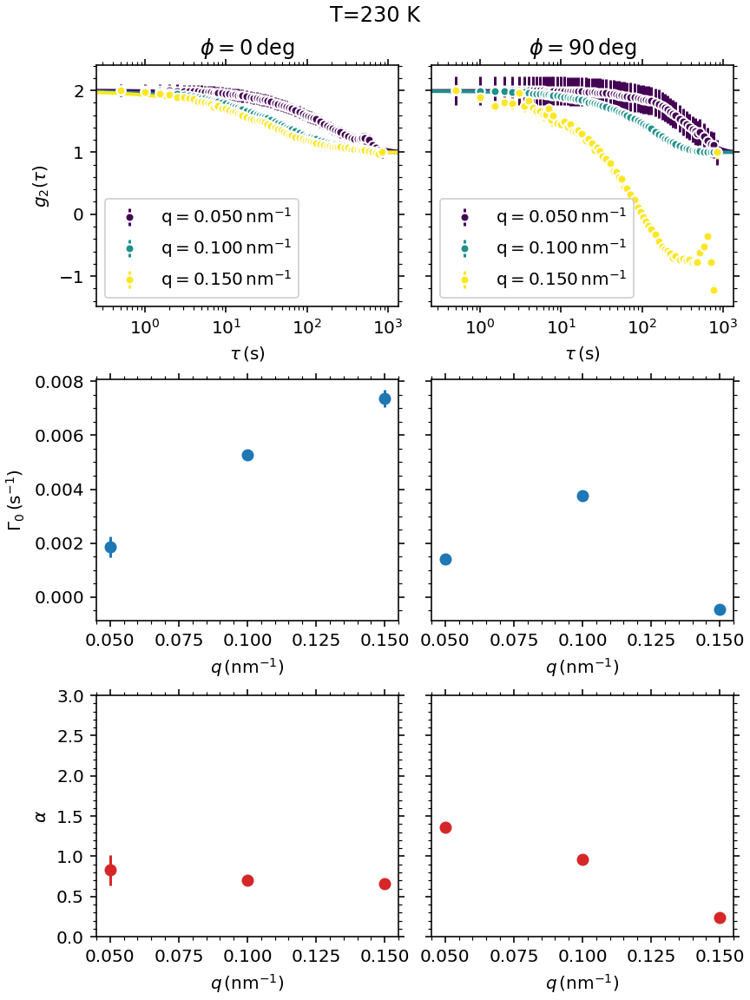

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,537.389342,114.028678,0.827568,0.189891,1.0,0.002595,1,0.0,1.0,0.002595,1032.462051,5.136627,382.568716,352.444748
1,0.10,189.798591,4.811663,0.701401,0.020748,1.0,0.031468,1,0.0,1.0,0.031468,1032.462051,5.136627,382.568716,352.444748
2,0.15,135.950148,5.882661,0.654265,0.036012,1.0,0.048514,1,0.0,1.0,0.048514,1032.462051,5.136627,382.568716,352.444748


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,717.343241,NaN,1.356964,NaN,0.993201,NaN,1,NaN,0.993201,NaN,30218.15886,150.339099,1091.633031,1061.509064
1,0.10,266.978501,NaN,0.966055,NaN,0.987797,NaN,1,NaN,0.987797,NaN,30218.15886,150.339099,1091.633031,1061.509064
2,0.15,-2159.856228,NaN,0.234223,NaN,0.120614,NaN,1,NaN,0.120614,NaN,30218.15886,150.339099,1091.633031,1061.509064


<IPython.core.display.Javascript object>


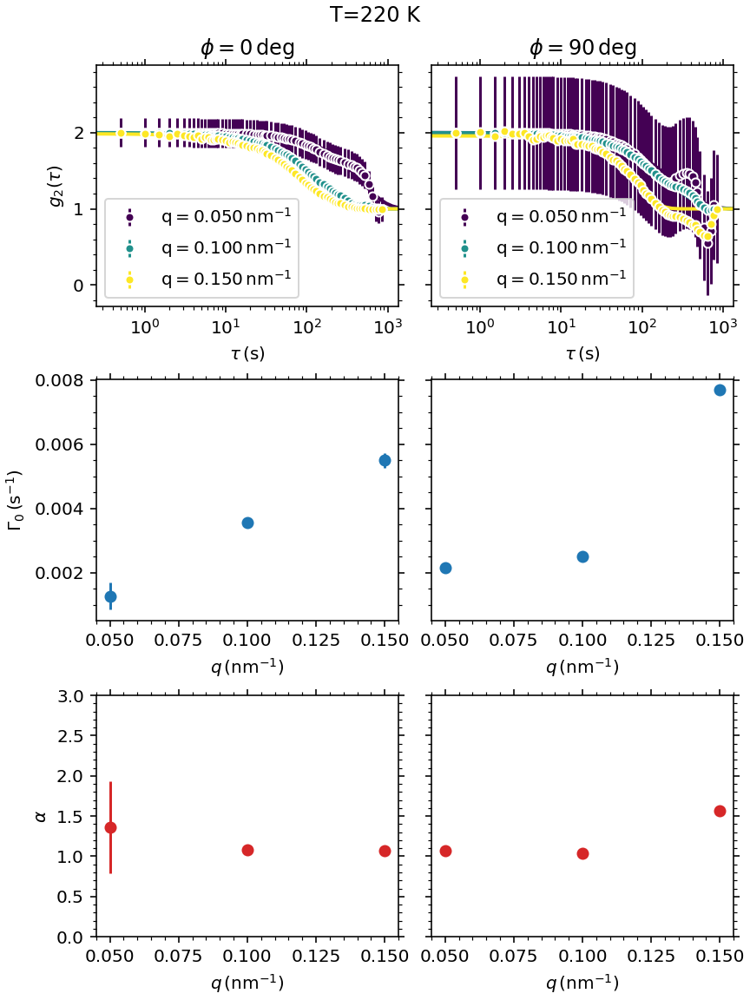

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,783.848167,255.037308,1.360990,0.576053,0.986589,0.072508,1,0.0,0.986589,0.072508,876.432953,4.360363,348.16203,318.038062
1,0.10,280.574332,7.579859,1.081198,0.036034,1.000000,0.003155,1,0.0,1.000000,0.003155,876.432953,4.360363,348.16203,318.038062
2,0.15,181.859633,7.660371,1.067703,0.060574,0.985467,0.017954,1,0.0,0.985467,0.017954,876.432953,4.360363,348.16203,318.038062


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,462.865385,NaN,1.072131,NaN,1.000000,NaN,1,NaN,1.000000,NaN,3758.147472,18.697251,653.884485,623.760517
1,0.10,398.709241,NaN,1.041068,NaN,1.000000,NaN,1,NaN,1.000000,NaN,3758.147472,18.697251,653.884485,623.760517
2,0.15,130.067933,NaN,1.561005,NaN,0.957404,NaN,1,NaN,0.957404,NaN,3758.147472,18.697251,653.884485,623.760517


<IPython.core.display.Javascript object>


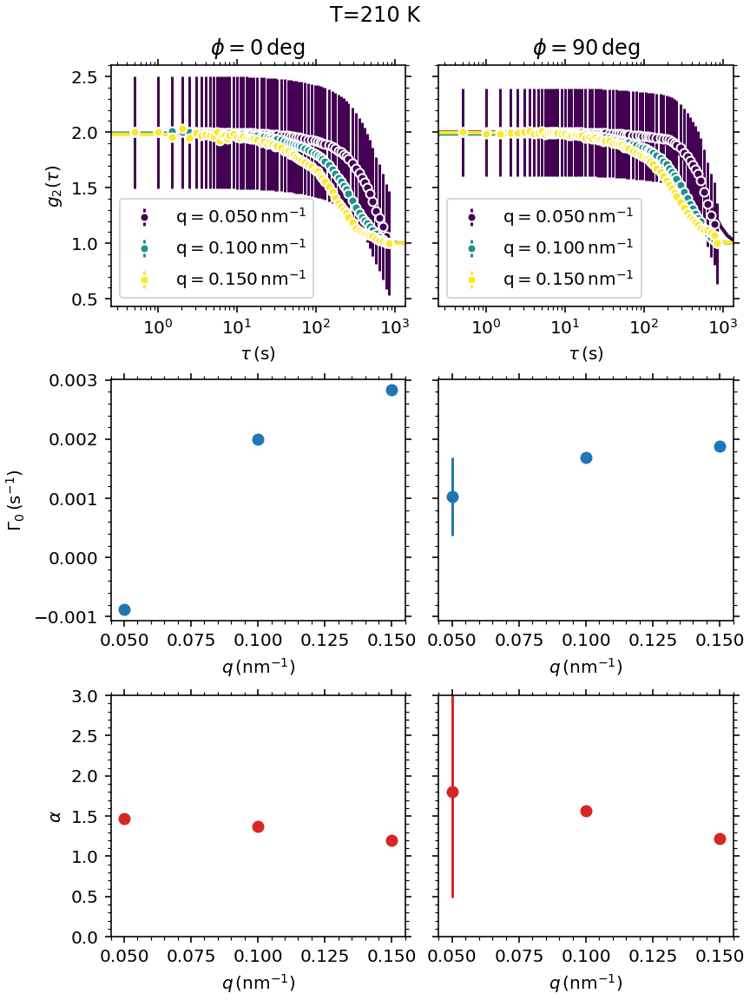

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,-1137.820704,NaN,1.464850,NaN,0.772193,NaN,1,NaN,0.772193,NaN,1288.392606,6.409913,429.073029,398.949061
1,0.10,501.809987,NaN,1.376672,NaN,0.991274,NaN,1,NaN,0.991274,NaN,1288.392606,6.409913,429.073029,398.949061
2,0.15,353.568830,NaN,1.203627,NaN,0.981886,NaN,1,NaN,0.981886,NaN,1288.392606,6.409913,429.073029,398.949061


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,970.729747,619.019036,1.799999,1.314966,1.000000,0.009701,1,0.0,1.000000,0.009701,637.626426,3.172271,281.359427,251.235459
1,0.10,591.338318,13.417518,1.568525,0.053605,0.984240,0.005776,1,0.0,0.984240,0.005776,637.626426,3.172271,281.359427,251.235459
2,0.15,531.432249,19.857888,1.222049,0.057828,0.996322,0.010333,1,0.0,0.996322,0.010333,637.626426,3.172271,281.359427,251.235459


<IPython.core.display.Javascript object>


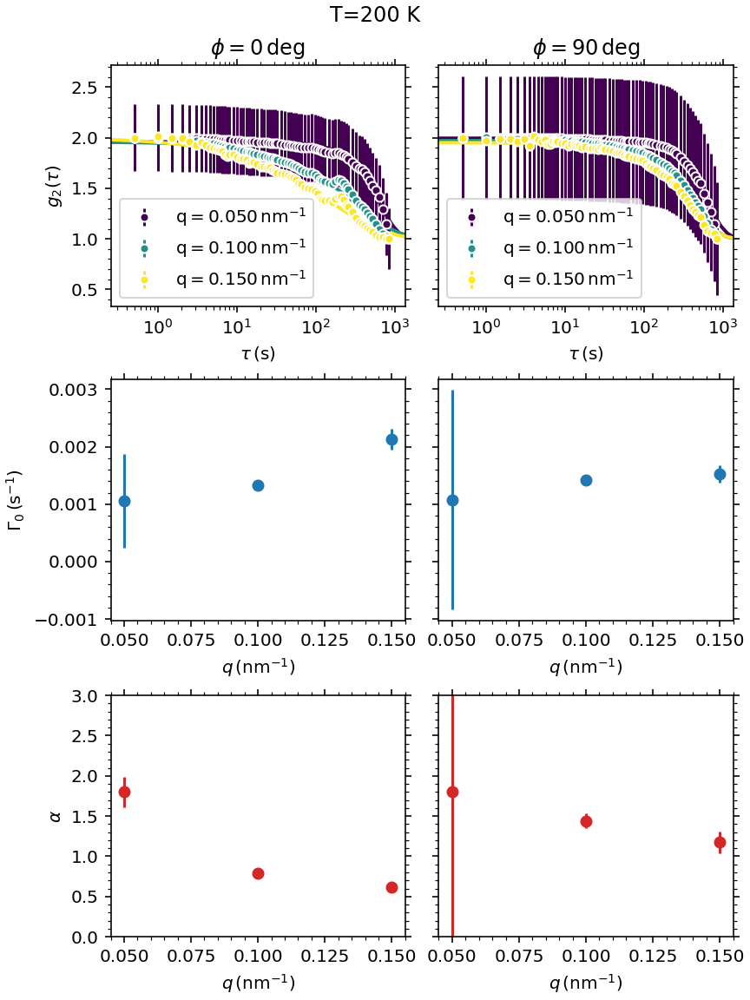

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,942.706920,725.095457,1.800000,0.187494,0.959650,0.134320,1,0.0,0.959650,0.134320,1314.492628,6.539764,433.284654,403.160686
1,0.10,756.273723,42.501555,0.785669,0.042614,0.958395,0.014650,1,0.0,0.958395,0.014650,1314.492628,6.539764,433.284654,403.160686
2,0.15,469.852814,39.628619,0.612026,0.053738,1.000000,0.021716,1,0.0,1.000000,0.021716,1314.492628,6.539764,433.284654,403.160686


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,929.547494,1649.882277,1.799971,4.796308,0.995021,0.325539,1,0.0,0.995021,0.325539,2276.854832,11.327636,548.646951,518.522984
1,0.10,706.174017,33.495834,1.440376,0.094568,0.971636,0.010942,1,0.0,0.971636,0.010942,2276.854832,11.327636,548.646951,518.522984
2,0.15,654.686108,63.095883,1.174249,0.135920,0.951218,0.023541,1,0.0,0.951218,0.023541,2276.854832,11.327636,548.646951,518.522984


<IPython.core.display.Javascript object>


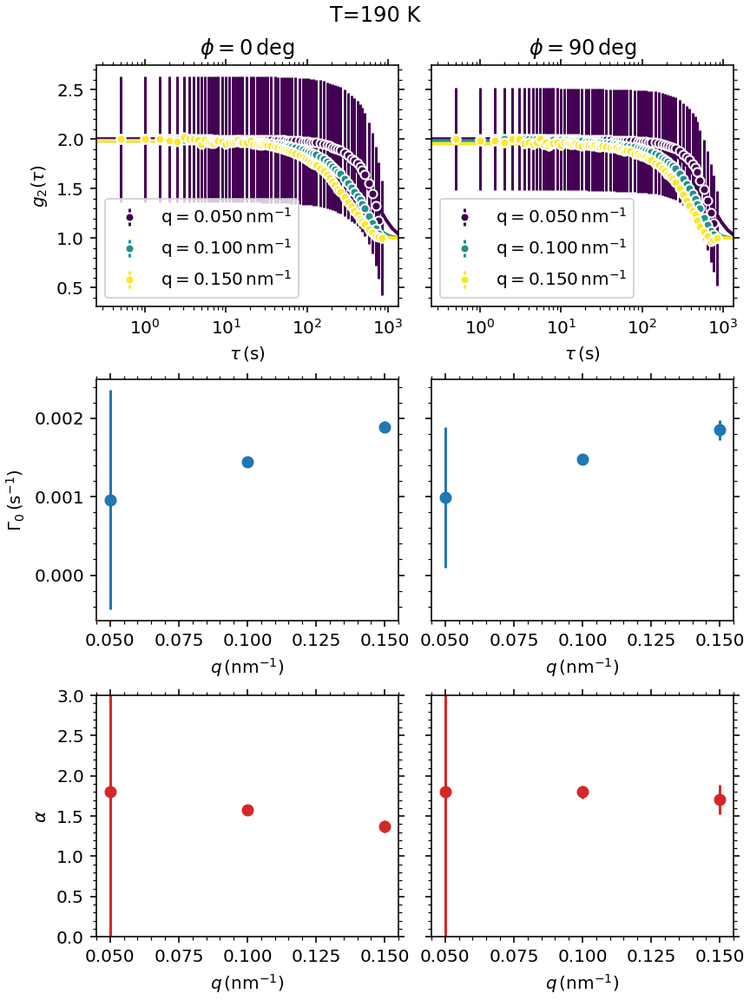

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,1042.626536,1518.765816,1.799999,2.904322,1.000000,0.047161,1,0.0,1.000000,0.047161,1075.439361,5.350445,391.133145,361.009177
1,0.10,692.452234,16.603080,1.580064,0.057343,0.982032,0.005811,1,0.0,0.982032,0.005811,1075.439361,5.350445,391.133145,361.009177
2,0.15,529.179983,19.867214,1.371445,0.071149,0.982776,0.010492,1,0.0,0.982776,0.010492,1075.439361,5.350445,391.133145,361.009177


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,1007.346618,909.702968,1.799993,2.554944,1.000000,0.089137,1,0.0,1.000000,0.089137,674.462053,3.355533,293.153623,263.029656
1,0.10,675.909372,20.025547,1.799990,0.084060,0.982557,0.007253,1,0.0,0.982557,0.007253,674.462053,3.355533,293.153623,263.029656
2,0.15,540.751304,36.772142,1.705146,0.182830,0.953390,0.016637,1,0.0,0.953390,0.016637,674.462053,3.355533,293.153623,263.029656


<IPython.core.display.Javascript object>


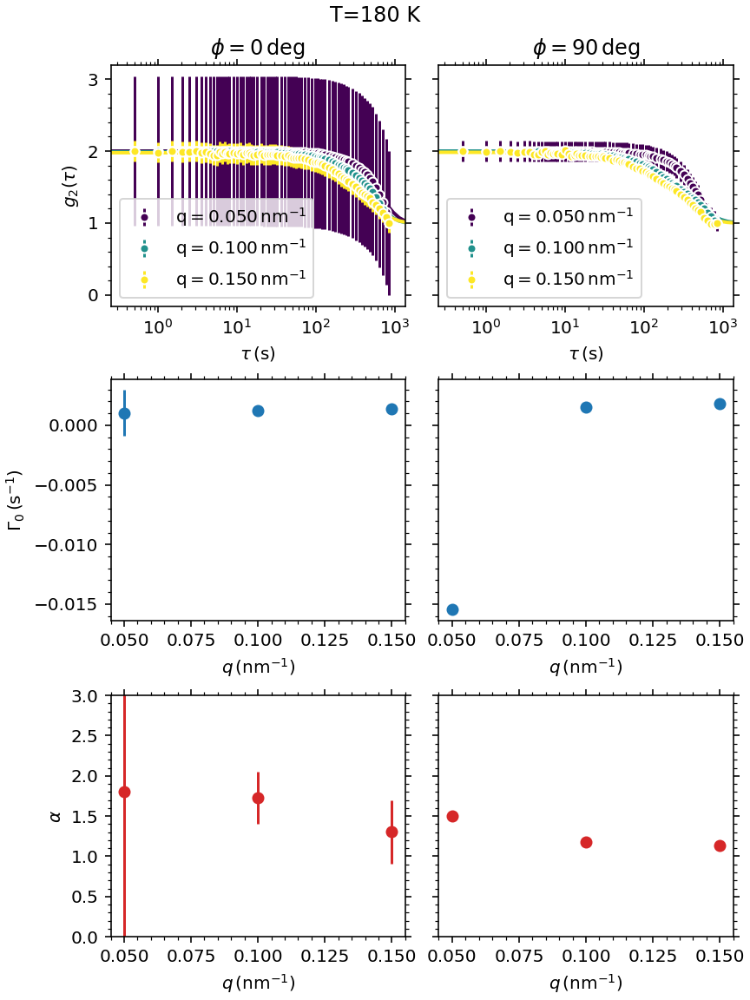

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,979.078359,1842.830517,1.800000,4.908165,0.999996,0.316684,1,0.0,0.999996,0.316684,745.187031,3.707398,314.094786,283.970818
1,0.10,811.041713,100.812780,1.725959,0.323495,0.989554,0.025546,1,0.0,0.989554,0.025546,745.187031,3.707398,314.094786,283.970818
2,0.15,740.890853,182.661670,1.304590,0.394386,0.976878,0.051743,1,0.0,0.976878,0.051743,745.187031,3.707398,314.094786,283.970818


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.05,-64.718580,NaN,1.497529,NaN,0.980281,NaN,1,NaN,0.980281,NaN,4169.524252,20.743902,675.698403,645.574435
1,0.10,669.766265,NaN,1.181526,NaN,1.000000,NaN,1,NaN,1.000000,NaN,4169.524252,20.743902,675.698403,645.574435
2,0.15,543.139923,NaN,1.130012,NaN,0.983552,NaN,1,NaN,0.983552,NaN,4169.524252,20.743902,675.698403,645.574435


In [25]:
for i,ind in enumerate(inds_xpcs_sorted):
    plot_many_qs(d, ind, nq, nangles, qv_phi, qv, phi, rescale=True, dofit=1, title=f'T={T[i]} K')

# Plots g2s from Xana and tune the fit

In [26]:
g = CorrFunc(d)
g.get_g2(inds_xpcs_sorted[2], merge='append')

Loaded 1 correlation functions.


In [27]:
g.reset_rescaled()
g.rescale(interval=(1, -2), norm_contrast=1)
# g.rescale(normby='fit')

<IPython.core.display.Javascript object>


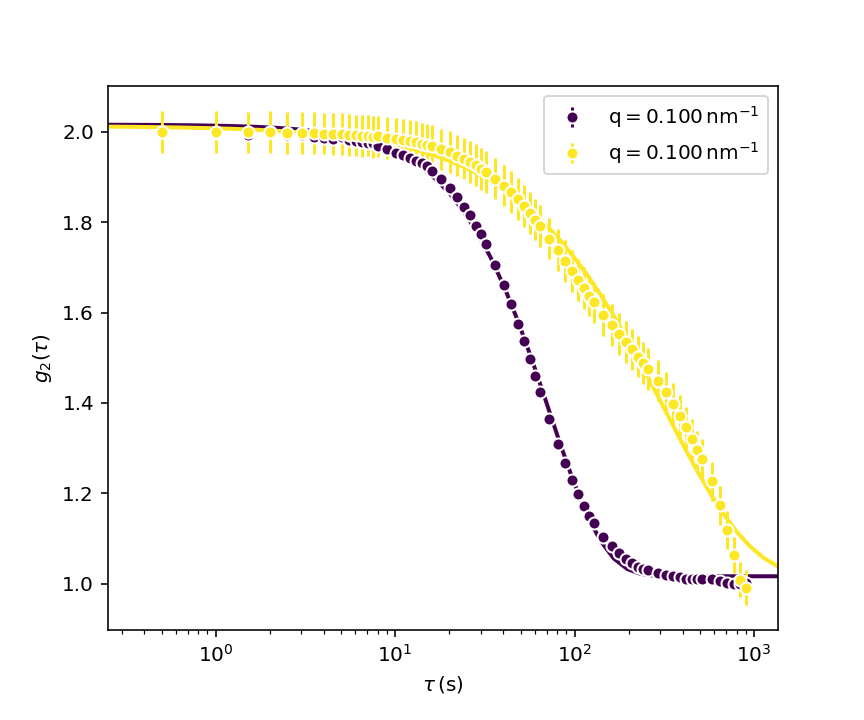

Fit successful: False


In [28]:
g.plot_g2(#nq=np.arange(0,len(qv)),
          nq=np.arange(2,4),
#           nq=np.arange(0,3),
          dofit=1, doplot='data_legq_fit',color_mode=1,verbose=True,#method='equal',
          # change_marker=1,
#           data='rescaled',
#            fix={'a': 1},
           init={'t0': (1e2, 0, 1e3),
                 'a': (1, 0, None),
                 'g0': (1.5, 0, 3),
                 'beta': (.1, 0, 4)
                }, 
#           fitglobal=['g0', 'a'], 
           cmap='viridis')
# ax.grid(ls=':')

# Cool plot fo paper draft

In [25]:
# angles_per_q = np.unique(qv, return_counts=True)
np.unique(qv, return_counts=True)[1]

array([2, 2, 2])

In [26]:
phi = d.setup.phiv
print(f'angles array: {phi}')
phi = phi[:,0] + phi[:,1]/2
print(f'angles vector: {phi}')
qv = d.setup.qv
print(f'q-vector: {qv}')

qv_phi = np.zeros((len(qv), 2))
qv_phi[:,0] = qv
i0 = 0
for i1 in np.unique(qv, return_counts=True)[1]:
    qv_phi[i0:i0+i1,1] = phi[:i1]
    i0 += i1

nangles = len(phi) # number of unqiue angles
nq = len(np.unique(qv)) # number of unique q-values

angles array: [[-22.5  45. ]
 [ 67.5  45. ]]
angles vector: [ 0. 90.]
q-vector: [0.05 0.05 0.1  0.1  0.15 0.15]


In [27]:
qv_phi

array([[5.0e-02, 0.0e+00],
       [5.0e-02, 9.0e+01],
       [1.0e-01, 0.0e+00],
       [1.0e-01, 9.0e+01],
       [1.5e-01, 0.0e+00],
       [1.5e-01, 9.0e+01]])

In [28]:
phi

array([ 0., 90.])

In [29]:
def plot_many_qs_one_phi(ana, ind_xpcs, nq, nangles, qv_phi, qv, qv_sel, phi,  axs, temp,
                         dofit=0, rescale=False, title=None, col=None):
    """Create a plot when a setup was used with only 2 angles and several q-bins.
    """
    # Now we use the CorrFunc module
    g = CorrFunc(ana)

    angles_per_q = np.unique(qv, return_counts=True)[1]

    a = axs[0]    
    g.get_g2(ind_xpcs, merge='merge')
    q = np.where(np.isclose(qv_phi[:,1], phi))[0][qv_sel]
    g.nq = np.arange(q, q+1)
    qv = qv_phi[g.nq, 0]
    if rescale:
        g.rescale(0, interval=(1,-2), norm_contrast=True)
        
    g.plot_g2(doplot='data_fit', color_mode=2, dofit=dofit, 
#               cmap='viridis', #data='rescaled',
              color=col,
              verbose=False,
              ax=a, markersize=5, method='equal',
              init={"t0":(100, None, None),
                   "beta":(.2,0,2),
                   "a":(1,0,2),
                   "g0":(1.5,0,3)},
#               fitglobal=['g0'],
#               fix={"a":1,}
             )

    a = axs[1]
    if dofit:
        a.errorbar(temp, g.pars[0]['t0'], yerr=g.pars[0]['dt0'], fmt='o',ls='', color=col)
    
    a = axs[2]
    if dofit:
        a.errorbar(temp, g.pars[0]['g0'], yerr=g.pars[0]['dg0'], fmt='o', c=col, ls='', label=f'{temp} K')
    
    return g.pars[0]['t0'], g.pars[0]['dt0'],  g.pars[0]['g0'], g.pars[0]['dg0']


In [30]:
                         #250      #220
good_angle = [0, 0, 0, 0, 90, 0, 0, 0, 0, 90, 90, 0]

<IPython.core.display.Javascript object>


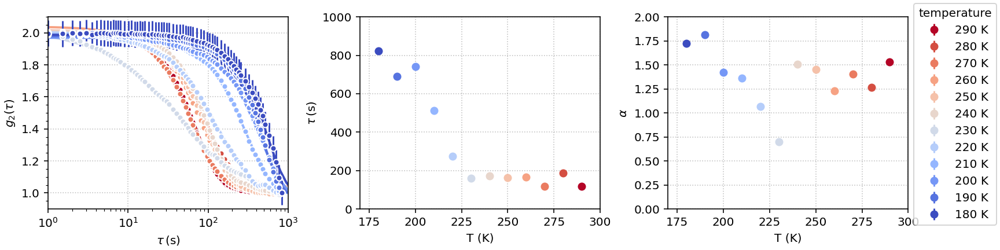

<IPython.core.display.Javascript object>


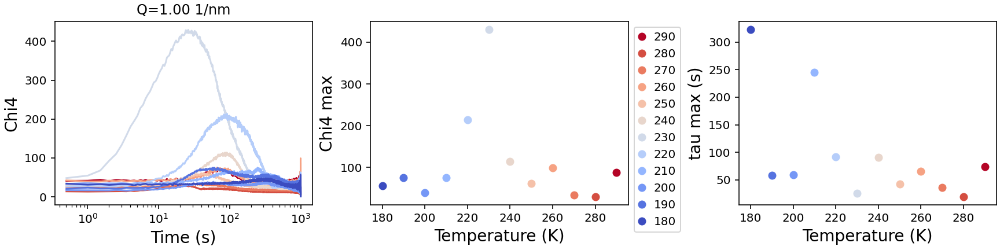

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


<IPython.core.display.Javascript object>


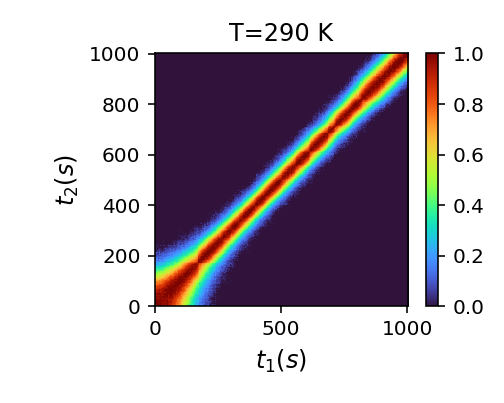

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


<IPython.core.display.Javascript object>


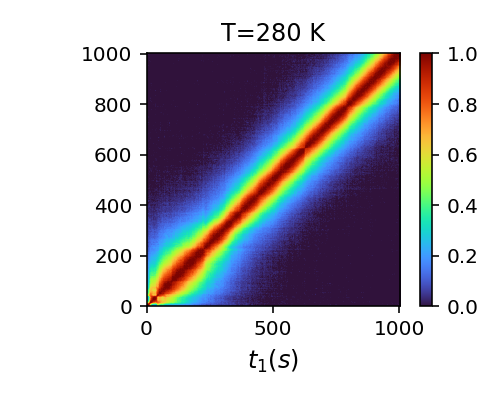

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


<IPython.core.display.Javascript object>


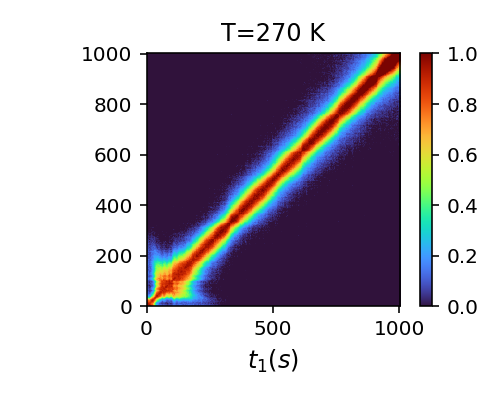

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


<IPython.core.display.Javascript object>


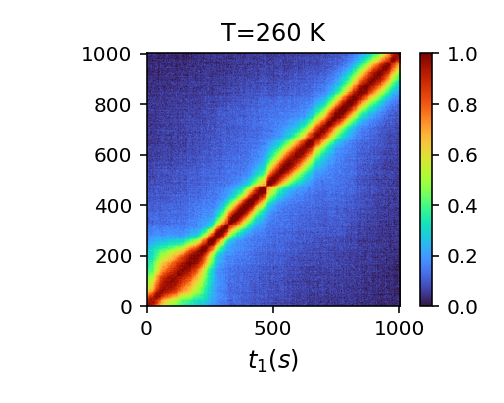

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


<IPython.core.display.Javascript object>


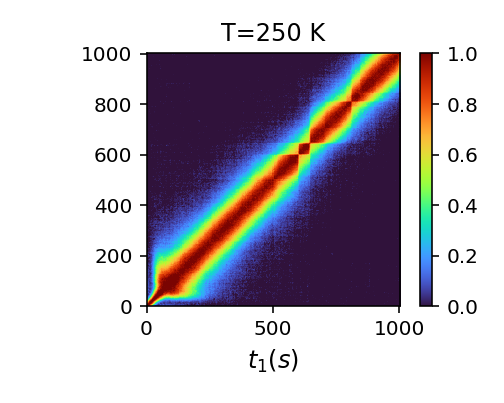

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


<IPython.core.display.Javascript object>


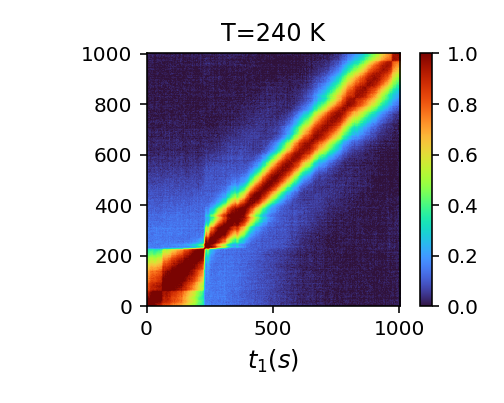

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


<IPython.core.display.Javascript object>


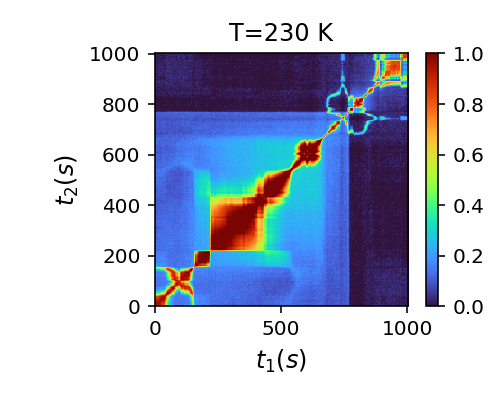

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


<IPython.core.display.Javascript object>


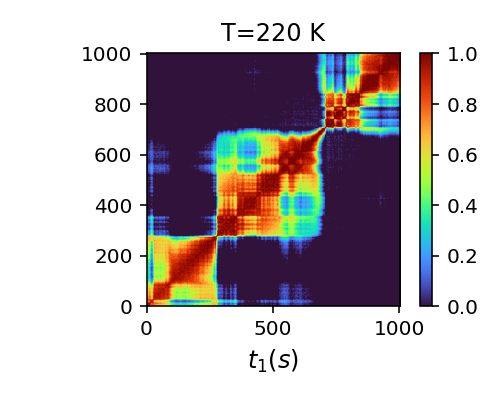

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


<IPython.core.display.Javascript object>


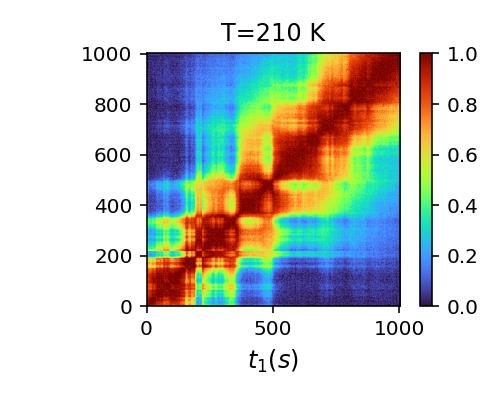

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


<IPython.core.display.Javascript object>


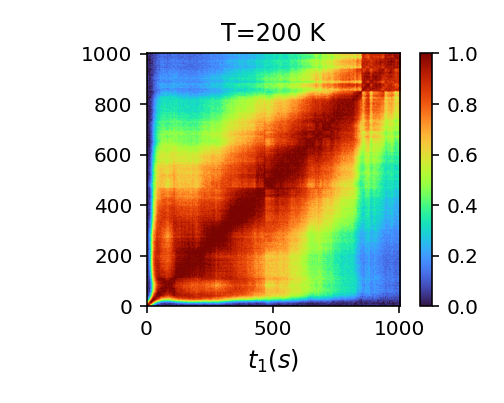

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


<IPython.core.display.Javascript object>


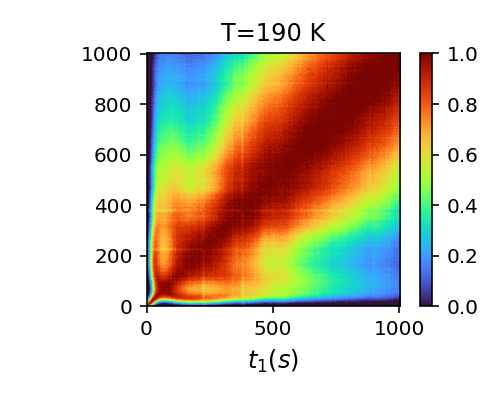

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: False


<IPython.core.display.Javascript object>


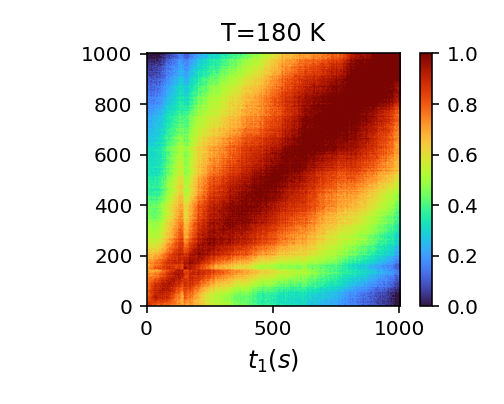

In [31]:
fig, axs = plt.subplots(1, 3, figsize=(12,3), constrained_layout=True)
f, (a1,a2,a3) = plt.subplots(1,3, figsize=(12,3), constrained_layout=True)

taus, alphas = np.ones(shape=(len(T),2)), np.ones(shape=(len(T),2))

col = plt.cm.coolwarm_r(np.linspace(0,1,len(inds_xpcs_sorted)))

for i,ind in enumerate(inds_xpcs_sorted[:]):
    qv_sel = 1
    phi = good_angle[i]
    taus[i,0],taus[i,1],alphas[i,0],alphas[i,1] = plot_many_qs_one_phi(d, ind, nq, nangles, qv_phi, qv, qv_sel=qv_sel, phi=phi, rescale=True, dofit=1, 
                         axs=axs, col=col[i], temp=T[i])#, title=f'T={T[i]} K')
    tmp = d.get_item(ind)
    
    if phi == 0: q_sel = 2
    elif phi == 90: q_sel = 3
    else: print("Unknown qv")
        
    chi4 = tmp['chi4'][q_sel]
    xtime = tmp['twotime_xy']
    ttc = tmp['twotime_corf'][q_sel]
    del tmp
    
    a1.plot(xtime[1:-1], chi4[:,0], c=col[i], label=T[i])
    a2.plot(T[i], np.max(chi4[:,0]), ls='',marker='o', c=col[i], label=T[i])
    a3.plot(T[i], xtime[np.argmax(chi4[:-50,0])], ls='',marker='o', c=col[i], label=T[i])
    
    # plot ttcs
    plt.figure(figsize=(3.5,2.8))
    vmin = np.average(ttc[0, -10:])#, np.mean(np.diag(ttc))
    ttc_n = ttc - vmin
    vmax = np.mean(np.diag(ttc_n))
    ttc_n /= vmax
    plt.imshow(ttc_n, cmap='turbo', origin='lower', extent=[xtime[0],xtime[-1]]*2, 
               vmin=0,vmax=1)
#                vmin=vmin, vmax=vmax)
    plt.xlabel(r'$t_1 (s)$', fontsize=12)
    if (T[i] == 290) or (T[i] == 230): plt.ylabel(r'$t_2 (s)$', fontsize=12)
    plt.colorbar()
    plt.title(f'T={T[i]} K')
    plt.tight_layout()
    plt.savefig(f'../09-plots/ttc-{T[i]}')
    plt.show()

axs[0].grid(ls=':',color='gray',alpha=.5)
axs[0].set_ylim(0.9,2.1)
axs[0].set_xlim(1,1000)
axs[0].set_xscale('log')
axs[0].minorticks_on()

axs[1].grid(ls=':',color='gray',alpha=.5)
axs[1].set_xlim(170,300)
axs[1].set_ylim(0,1000)
# axs[1].set_ylim(0,0.009)
axs[1].set_xscale('linear')
axs[1].set_xlabel('T (K)')
# axs[1].set_ylabel(r'$\Gamma_0\,(\mathrm{s}^{-1})$')
axs[1].set_ylabel(r'$\tau\,(\mathrm{s})$')

axs[2].grid(ls=':',color='gray',alpha=.5)
axs[2].legend(title='temperature', ncol=1, bbox_to_anchor=[1,1.1])
axs[2].set_xlim(170,300)
axs[2].set_ylim(0,2)
axs[2].set_xscale('linear')
axs[2].set_xlabel('T (K)')
# axs[2].set_xlabel('$q\,(\mathrm{nm}^{-1})$')
axs[2].set_ylabel(r'$\alpha$')

a1.set_title(f'Q={qv_sel:.2f} 1/nm')
a1.set_xscale('log')
a2.legend(handlelength=.5, ncol=1, bbox_to_anchor=[1,1])
a1.set_xlabel('Time (s)', fontsize=14)
a1.set_ylabel('Chi4', fontsize=14)
a2.set_xlabel('Temperature (K)', fontsize=14)
a2.set_ylabel('Chi4 max', fontsize=14)
a3.set_xlabel('Temperature (K)', fontsize=14)
a3.set_ylabel('tau max (s)', fontsize=14)

# fig.savefig('../09-plots/fig3-b.png', dpi=300)
fig.show()
f.show()

# For poster

In [36]:
T

array([290, 280, 270, 260, 250, 240, 230, 220, 210, 200, 190, 180])

<IPython.core.display.Javascript object>


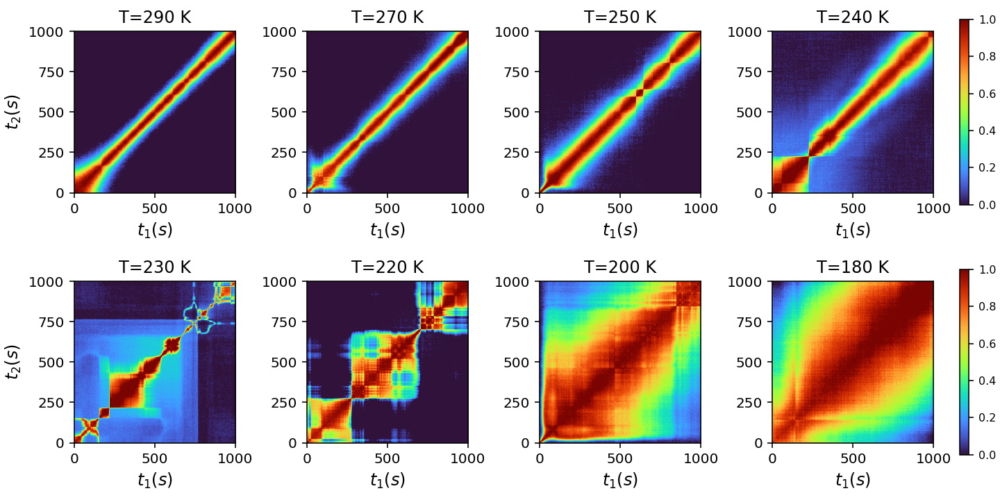

In [37]:
f, axs = plt.subplots(2,4, figsize=(10,5), constrained_layout=True)
axs = np.array(axs)
axs = np.ravel(axs) #axs.T

taus, alphas = np.ones(shape=(len(T),2)), np.ones(shape=(len(T),2))
col = plt.cm.coolwarm_r(np.linspace(0,1,len(inds_xpcs_sorted)))

chosen_ind = [0,2,4,5,6,7,9,11]
a = axs[0]
j = 0

for i,ind in enumerate(inds_xpcs_sorted[:]):
    qv_sel = 1
    phi = good_angle[i]
    tmp = d.get_item(ind)
    
    if phi == 0: q_sel = 2
    elif phi == 90: q_sel = 3
    else: print("Unknown qv")
        
    xtime = tmp['twotime_xy']
    ttc = tmp['twotime_corf'][q_sel]
    del tmp
    
    if i in chosen_ind:
        vmin = np.average(ttc[0, -10:])#, np.mean(np.diag(ttc))
        ttc_n = ttc - vmin
        vmax = np.mean(np.diag(ttc_n))
        ttc_n /= vmax
        im = a.imshow(ttc_n, cmap='turbo', origin='lower', extent=[xtime[0],xtime[-1]]*2, 
                   vmin=0,vmax=1)
        a.set_xlabel(r'$t_1 (s)$', fontsize=12)
        if (T[i] == 290) or (T[i] == 230): a.set_ylabel(r'$t_2 (s)$', fontsize=12)
#         a.colorbar()
        if (T[i] == 240) or (T[i] == 180):
            cb = plt.colorbar(im, ax=a, shrink=.9, )#aspect=50,)
            cb.ax.tick_params(labelsize=8) 
        a.set_title(f'T={T[i]} K')
        j += 1
        if j < 8: a = axs[j]

# f.savefig('../09-plots/ttcs-poster.png', dpi=900)
f.show()

# Work on g2s

In [32]:
def plot_many_qs_one_phi_2(ana, ind_xpcs, nq, nangles, qv_phi, qv, qv_sel, phi,  axs, temp,
                         dofit=0, rescale=False, title=None, col=None):
    """Create a plot when a setup was used with only 2 angles and several q-bins.
    """
    # Now we use the CorrFunc module
    g = CorrFunc(ana)

    angles_per_q = np.unique(qv, return_counts=True)[1]

    a = axs
    g.get_g2(ind_xpcs, merge='merge')
    q = np.where(np.isclose(qv_phi[:,1], phi))[0][qv_sel]
    g.nq = np.arange(q, q+1)
    qv = qv_phi[g.nq, 0]
    if rescale:
        g.rescale(0, interval=(1,-2), norm_contrast=True)
        
    g.plot_g2(doplot='data_fit', color_mode=2, dofit=dofit, 
#               cmap='viridis', #data='rescaled',
              color=col,
              verbose=False,
              ax=a, markersize=5, method='equal',
              init={"t0":(100, None, None)},
#               fitglobal=['g0'],
#               fix={"a":1,}
             )
    display(g.pars[0])

    return g, g.pars[0]


In [33]:
from scipy.interpolate import interp1d

In [34]:
def log_interp1d(xx, yy, kind='linear'):
    logx = np.log10(xx)
    logy = np.log10(yy)
    lin_interp = interp1d(logx, logy, kind=kind, fill_value="extrapolate")
    log_interp = lambda zz: np.power(10.0, lin_interp(np.log10(zz)))
    return log_interp

<IPython.core.display.Javascript object>


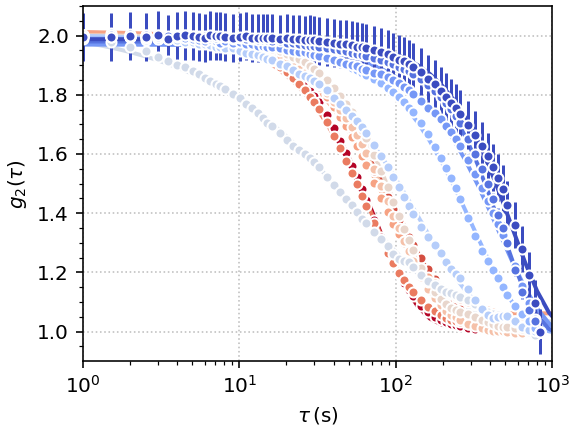

<IPython.core.display.Javascript object>


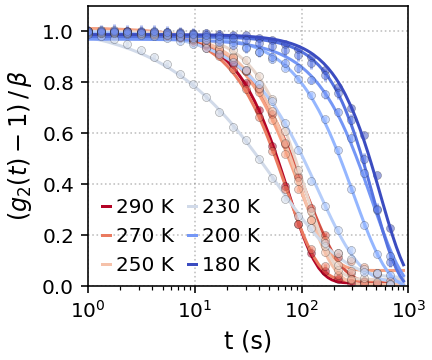

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,115.803599,1.746738,1.547646,0.033763,0.995421,0.006683,1.012401,0.003903,0.995421,0.006683,210.158237,3.184216,93.949567,84.955586


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,186.160664,2.722746,1.265408,0.020988,1.0,0.006292,1.012527,0.003743,1.0,0.006292,222.325345,3.368566,97.889242,88.895261


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,115.978138,2.083806,1.443967,0.035788,0.988411,0.007891,1.021639,0.004449,0.988411,0.007891,351.627761,5.327693,129.979432,120.985451


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,151.45328,3.724366,1.375203,0.042614,0.95224,0.009679,1.061401,0.005889,0.95224,0.009679,426.117365,6.456324,143.429351,134.43537


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,162.300715,4.490707,1.468622,0.052329,0.995596,0.011376,1.0062,0.007512,0.995596,0.011376,218.349637,3.308328,96.626147,87.632166


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,165.669869,2.505307,1.594063,0.033491,0.974887,0.006261,1.026252,0.004212,0.974887,0.006261,158.904469,2.407643,74.380538,65.386557


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,158.986261,5.990846,0.70022,0.022895,1.0,0.016996,1.033432,0.006189,1.0,0.016996,256.422044,3.885182,107.877043,98.883062


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,267.605151,9.351926,1.094701,0.033888,0.987609,0.012936,1.01591,0.009036,0.987609,0.012936,168.929899,2.559544,78.663182,69.669201


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,511.507512,22.465043,1.363858,0.046211,1.0,0.00011,0.991207,0.017939,1.0,0.00011,233.523024,3.538228,101.328961,92.33498


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,742.065511,116.553043,1.421051,0.129442,1.0,0.086873,0.969735,0.083102,1.0,0.086873,497.45634,7.537217,154.26486,145.270879


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,691.826196,61.993898,1.8,0.13079,1.0,0.057172,0.98008,0.054885,1.0,0.057172,200.604153,3.039457,90.692664,81.698683


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,822.217909,462.306548,1.726837,0.587285,1.0,0.022685,0.987781,0.390936,1.0,0.022685,247.890669,3.755919,105.50846,96.514479


In [35]:
fig2, axs2 = plt.subplots(1, 1, figsize=(4,3), constrained_layout=True)
fig, axs = plt.subplots(1, 1, figsize=(3,2.5), constrained_layout=True)

taus, alphas = np.ones(shape=(len(T),2)), np.ones(shape=(len(T),2))
col = plt.cm.coolwarm_r(np.linspace(0,1,len(inds_xpcs_sorted)))

for i,ind in enumerate(inds_xpcs_sorted[:]):
    qv_sel = 1
    phi = good_angle[i]
    g, pars = plot_many_qs_one_phi_2(d, ind, nq, nangles, qv_phi, qv, qv_sel=qv_sel, phi=phi, rescale=True, dofit=1, 
                         axs=axs2, col=col[i], temp=T[i])#, title=f'T={T[i]} K')
    
    if phi == 0: q_sel = 2
    elif phi == 90: q_sel = 3
    else: print("Unknown qv")

    t = g.corrFuncRescaled[0][0][1:,0]
    qv = g.corrFuncRescaled[0][0][0, 1:]
    g2 = g.corrFuncRescaled[0][0][1:,1:]
    dg2 = g.corrFuncRescaled[0][1][1:,1:]

    f = log_interp1d(t[:-1], g2[:-1,q_sel]-1)
    df = log_interp1d(t[:-1], dg2[:-1,q_sel])
    
    t_log = np.logspace(0, np.log10(t[-1]), num=25)

    if T[i]==180:
        axs.plot(t_log, f(t_log),ls='', marker='o',ms=4,mec='k',mew=.2,c=col[i], alpha=.5)
    else:
        axs.errorbar(t_log, f(t_log), yerr=df(t_log), ls='',marker='o',ms=4,mec='k',mew=.2,c=col[i], alpha=.5)
    
    y_fit = pars['beta'].values[0] * np.exp(-2*(t/pars['t0'].values[0])**pars['g0'].values[0] ) + pars['a'].values[0]
#     axs.errorbar(t, g2[:,q_sel]-1, yerr=dg2[:,q_sel], ls='', marker='o', ms=4, 
#                     fillstyle='none', c=col[i], alpha=.7)
    
    if i in [0,2,4,6,9,len(T)-1]:
        axs.plot(t, y_fit-1, ls='-', c=col[i], alpha=1, label=f'{T[i]} K')
    else:
        axs.plot(t, y_fit-1, ls='-', c=col[i], alpha=1)
        
axs2.grid(ls=':',color='gray',alpha=.5)
axs2.set_ylim(0.9,2.1)
axs2.set_xlim(1,1000)
axs2.set_xscale('log')
axs2.minorticks_on()

axs.grid(ls=':',color='gray',alpha=.5)
axs.set_xlabel('t (s)', fontsize=12)
axs.legend(frameon=False, ncol=2,  #title='Temperature (K)',
           handlelength=.4, columnspacing=.7,handletextpad=.3, fontsize=10,
          loc=(.02,.01))
# columnspacing=0.7,handletextpad=0.2
# axs.set_ylabel(r'($\rm g_2$(t)-1) / $\beta$', fontsize=14)
axs.set_ylabel(r'$(g_2(t) - 1)\, /\,\beta$', fontsize=12)
# axs[1].set_ylim(0.9,1.2)
axs.set_xlim(1,1000)
axs.set_ylim(0,1.1)
axs.set_xscale('log')
# axs.minorticks_on()

# fig.savefig("../09-plots/fig3-b.png", dpi=900)
fig.show()

<IPython.core.display.Javascript object>


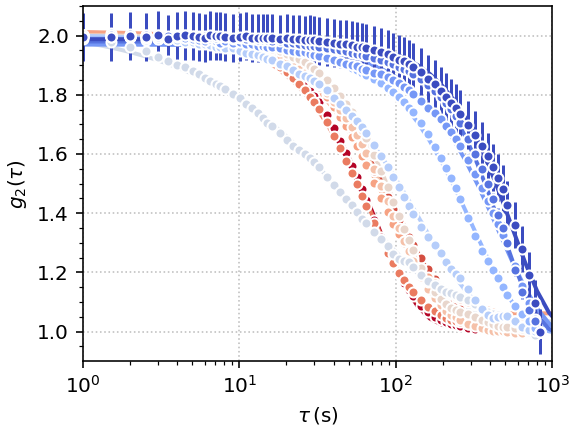

<IPython.core.display.Javascript object>


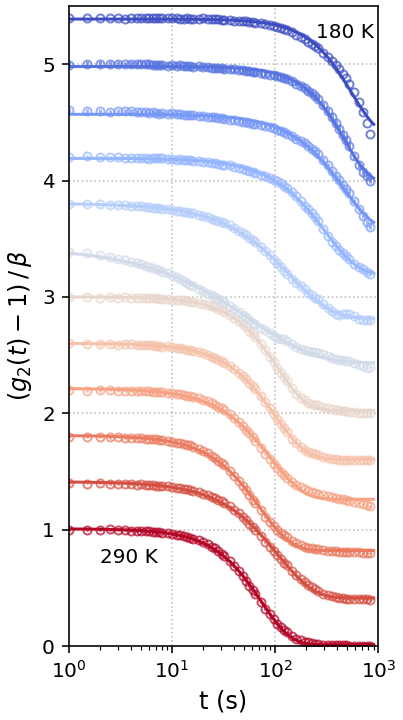

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,115.803599,1.746738,1.547646,0.033763,0.995421,0.006683,1.012401,0.003903,0.995421,0.006683,210.158237,3.184216,93.949567,84.955586


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,186.160664,2.722746,1.265408,0.020988,1.0,0.006292,1.012527,0.003743,1.0,0.006292,222.325345,3.368566,97.889242,88.895261


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,115.978138,2.083806,1.443967,0.035788,0.988411,0.007891,1.021639,0.004449,0.988411,0.007891,351.627761,5.327693,129.979432,120.985451


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,151.45328,3.724366,1.375203,0.042614,0.95224,0.009679,1.061401,0.005889,0.95224,0.009679,426.117365,6.456324,143.429351,134.43537


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,162.300715,4.490707,1.468622,0.052329,0.995596,0.011376,1.0062,0.007512,0.995596,0.011376,218.349637,3.308328,96.626147,87.632166


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,165.669869,2.505307,1.594063,0.033491,0.974887,0.006261,1.026252,0.004212,0.974887,0.006261,158.904469,2.407643,74.380538,65.386557


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,158.986261,5.990846,0.70022,0.022895,1.0,0.016996,1.033432,0.006189,1.0,0.016996,256.422044,3.885182,107.877043,98.883062


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,267.605151,9.351926,1.094701,0.033888,0.987609,0.012936,1.01591,0.009036,0.987609,0.012936,168.929899,2.559544,78.663182,69.669201


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,511.507512,22.465043,1.363858,0.046211,1.0,0.00011,0.991207,0.017939,1.0,0.00011,233.523024,3.538228,101.328961,92.33498


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,742.065511,116.553043,1.421051,0.129442,1.0,0.086873,0.969735,0.083102,1.0,0.086873,497.45634,7.537217,154.26486,145.270879


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,691.826196,61.993898,1.8,0.13079,1.0,0.057172,0.98008,0.054885,1.0,0.057172,200.604153,3.039457,90.692664,81.698683


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,822.217909,462.306548,1.726837,0.587285,1.0,0.022685,0.987781,0.390936,1.0,0.022685,247.890669,3.755919,105.50846,96.514479


(25,)


In [36]:
fig2, axs2 = plt.subplots(1, 1, figsize=(4,3), constrained_layout=True)
fig, axs = plt.subplots(1, 1, figsize=(2.8,5), constrained_layout=True)

taus, alphas = np.ones(shape=(len(T),2)), np.ones(shape=(len(T),2))
col = plt.cm.coolwarm_r(np.linspace(0,1,len(inds_xpcs_sorted)))
off = .4

for i,ind in enumerate(inds_xpcs_sorted[:]):
    qv_sel = 1
    phi = good_angle[i]
    g, pars = plot_many_qs_one_phi_2(d, ind, nq, nangles, qv_phi, qv, qv_sel=qv_sel, phi=phi, rescale=True, dofit=1, 
                         axs=axs2, col=col[i], temp=T[i])#, title=f'T={T[i]} K')
    
    if phi == 0: q_sel = 2
    elif phi == 90: q_sel = 3
    else: print("Unknown qv")

    t = g.corrFuncRescaled[0][0][1:,0]
    qv = g.corrFuncRescaled[0][0][0, 1:]
    g2 = g.corrFuncRescaled[0][0][1:,1:]
    dg2 = g.corrFuncRescaled[0][1][1:,1:]

    f = log_interp1d(t[:-1], g2[:-1,q_sel]-1)
    df = log_interp1d(t[:-1], dg2[:-1,q_sel])
    
    t_log = np.logspace(0, np.log10(t[-1]), num=25)
    print(np.shape(f(t_log)))

#     axs.errorbar(t_log, f(t_log)+off*i, yerr=df(t_log), ls='', marker='o', ms=6, fillstyle='none', c=col[i], alpha=1)
    
    y_fit = pars['beta'].values[0] * np.exp(-2*(t/pars['t0'].values[0])**pars['g0'].values[0] ) + pars['a'].values[0]
    
    if T[i]==180:
        axs.plot(t, g2[:,q_sel]-1+off*i,ls='',marker='o',ms=4,fillstyle='none',c=col[i],alpha=.7)
    else:
        axs.errorbar(t, g2[:,q_sel]-1+off*i,yerr=dg2[:,q_sel],ls='',marker='o',ms=4,fillstyle='none',c=col[i],alpha=.7)
    
    axs.plot(t, y_fit-1+off*i, ls='-', c=col[i], label=f'{T[i]} K', alpha=1)
    
axs2.grid(ls=':',color='gray',alpha=.5)
axs2.set_ylim(0.9,2.1)
axs2.set_xlim(1,1000)
axs2.set_xscale('log')
axs2.minorticks_on()

axs.grid(ls=':',color='gray',alpha=.5)
axs.set_xlabel('t (s)', fontsize=12)
# axs.set_ylabel(r'($\rm g_2$(t)-1) / $\beta$', fontsize=14)
axs.set_ylabel(r'$(g_2(t) - 1)\, /\,\beta$', fontsize=12)
# axs[1].set_ylim(0.9,1.2)
axs.set_xlim(1,1000)
axs.set_ylim(0,5.5)
# axs.legend(frameon=False, bbox_to_anchor=[1.1,1], handlelength=0.6)
axs.text(0.1,0.13, '290 K', transform=axs.transAxes)
axs.text(0.8,0.95, '180 K', transform=axs.transAxes)
axs.set_xscale('log')
# axs.minorticks_on()

# fig.savefig("../09-plots/fig3-b-tall.png", dpi=300)
fig.show()

<IPython.core.display.Javascript object>


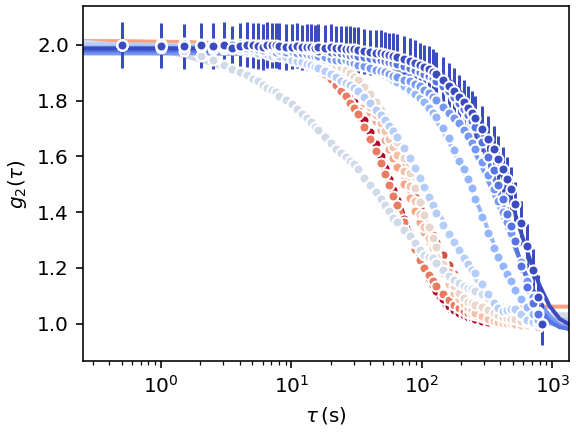

<IPython.core.display.Javascript object>


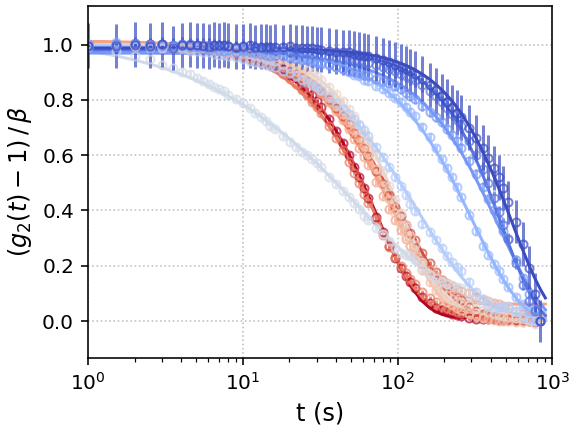

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,115.803599,1.746738,1.547646,0.033763,0.995421,0.006683,1.012401,0.003903,0.995421,0.006683,210.158237,3.184216,93.949567,84.955586


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,186.160664,2.722746,1.265408,0.020988,1.0,0.006292,1.012527,0.003743,1.0,0.006292,222.325345,3.368566,97.889242,88.895261


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,115.978138,2.083806,1.443967,0.035788,0.988411,0.007891,1.021639,0.004449,0.988411,0.007891,351.627761,5.327693,129.979432,120.985451


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,151.45328,3.724366,1.375203,0.042614,0.95224,0.009679,1.061401,0.005889,0.95224,0.009679,426.117365,6.456324,143.429351,134.43537


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,162.300715,4.490707,1.468622,0.052329,0.995596,0.011376,1.0062,0.007512,0.995596,0.011376,218.349637,3.308328,96.626147,87.632166


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,165.669869,2.505307,1.594063,0.033491,0.974887,0.006261,1.026252,0.004212,0.974887,0.006261,158.904469,2.407643,74.380538,65.386557


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,158.986261,5.990846,0.70022,0.022895,1.0,0.016996,1.033432,0.006189,1.0,0.016996,256.422044,3.885182,107.877043,98.883062


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,267.605151,9.351926,1.094701,0.033888,0.987609,0.012936,1.01591,0.009036,0.987609,0.012936,168.929899,2.559544,78.663182,69.669201


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,511.507512,22.465043,1.363858,0.046211,1.0,0.00011,0.991207,0.017939,1.0,0.00011,233.523024,3.538228,101.328961,92.33498


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,742.065511,116.553043,1.421051,0.129442,1.0,0.086873,0.969735,0.083102,1.0,0.086873,497.45634,7.537217,154.26486,145.270879


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,691.826196,61.993898,1.8,0.13079,1.0,0.057172,0.98008,0.054885,1.0,0.057172,200.604153,3.039457,90.692664,81.698683


(25,)
Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)
Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.1,822.217909,462.306548,1.726837,0.587285,1.0,0.022685,0.987781,0.390936,1.0,0.022685,247.890669,3.755919,105.50846,96.514479


(25,)


In [37]:
# -- save in cvs

fig2c = {}

fig2, axs2 = plt.subplots(1, 1, figsize=(4,3), constrained_layout=True)
fig, axs = plt.subplots(1, 1, figsize=(4,3), constrained_layout=True)

taus, alphas = np.ones(shape=(len(T),2)), np.ones(shape=(len(T),2))
col = plt.cm.coolwarm_r(np.linspace(0,1,len(inds_xpcs_sorted)))
off = 0

for i,ind in enumerate(inds_xpcs_sorted[:]):
    qv_sel = 1
    phi = good_angle[i]
    g, pars = plot_many_qs_one_phi_2(d, ind, nq, nangles, qv_phi, qv, qv_sel=qv_sel, phi=phi, rescale=True, dofit=1, 
                         axs=axs2, col=col[i], temp=T[i])#, title=f'T={T[i]} K')
    
    if phi == 0: q_sel = 2
    elif phi == 90: q_sel = 3
    else: print("Unknown qv")

    t = g.corrFuncRescaled[0][0][1:,0]
    qv = g.corrFuncRescaled[0][0][0, 1:]
    g2 = g.corrFuncRescaled[0][0][1:,1:]
    dg2 = g.corrFuncRescaled[0][1][1:,1:]

    f = log_interp1d(t[:-1], g2[:-1,q_sel]-1)
    df = log_interp1d(t[:-1], dg2[:-1,q_sel])
    
    t_log = np.logspace(0, np.log10(t[-1]), num=25)
    print(np.shape(f(t_log)))

#     axs.errorbar(t_log, f(t_log)+off*i, yerr=df(t_log), ls='', marker='o', ms=6, fillstyle='none', c=col[i], alpha=1)
    
    y_fit = pars['beta'].values[0] * np.exp(-2*(t/pars['t0'].values[0])**pars['g0'].values[0] ) + pars['a'].values[0]
    
    # save in dictionary
    if i == 0: fig2c['q (1/nm)'] = t
    fig2c[f'g2(t) T={T[i]} K'] = g2[:,q_sel]-1+off*i
    fig2c[f'g2(t) err T={T[i]} K'] = dg2[:,q_sel]
    
    axs.errorbar(t, g2[:,q_sel]-1+off*i,yerr=dg2[:,q_sel],ls='',marker='o',ms=4,fillstyle='none',c=col[i],alpha=.7)
    
    axs.plot(t, y_fit-1+off*i, ls='-', c=col[i], label=f'{T[i]} K', alpha=1)
    
axs.grid(ls=':',color='gray',alpha=.5)
axs.set_xlabel('t (s)', fontsize=12)
# axs.set_ylabel(r'($\rm g_2$(t)-1) / $\beta$', fontsize=14)
axs.set_ylabel(r'$(g_2(t) - 1)\, /\,\beta$', fontsize=12)
# axs[1].set_ylim(0.9,1.2)
axs.set_xlim(1,1000)
# axs.set_ylim(0,5.5)
axs.set_xscale('log')
# axs.minorticks_on()

# fig.savefig("../09-plots/fig3-b-tall.png", dpi=300)
fig.show()

**Prep of new P10 beamtime**

In [43]:
def plot_many_qs_one_phi_3(ana, ind_xpcs, nq, nangles, qv_phi, qv, phi,  axs, temp,
                         dofit=0, rescale=False, title=None, col=None):
    """Create a plot when a setup was used with only 2 angles and several q-bins.
    """
    # Now we use the CorrFunc module
    g = CorrFunc(ana)

    angles_per_q = np.unique(qv, return_counts=True)[1]

    a = axs
    g.get_g2(ind_xpcs, merge='merge')
    q = np.where(np.isclose(qv_phi[:,1], phi))[0]#[qv_sel]
    g.nq = np.arange(q, q+1)
    qv = qv_phi[g.nq, 0]
    
    if rescale:
        g.rescale(0, interval=(1,-2), norm_contrast=True)
        
    g.plot_g2(doplot='data_fit', color_mode=2, dofit=dofit, 
#               cmap='viridis', #data='rescaled',
              color=col,
              verbose=False,
              ax=a, markersize=5, method='equal',
              init={"t0":(100, None, None)},
#               fitglobal=['g0'],
#               fix={"a":1,}
             )
    display(g.pars[0])

    return g, g.pars[0]


In [58]:
rescale = True
g = CorrFunc(d)

angles_per_q = np.unique(qv, return_counts=True)[1]

a = axs
g.get_g2(inds_xpcs_sorted[0], merge='merge')

q = np.where(np.isclose(qv_phi[:,1], phi))[0]#[qv_sel]
# print(g.nq)
print()

g.nq = np.arange(2, 5)
qv = qv_phi[g.nq, 0]

if rescale:
    g.rescale(0, interval=(1,-2), norm_contrast=True)

g.plot_g2(doplot='data_fit', color_mode=2, dofit=1, 
              cmap='viridis', #data='rescaled',
#           color=col,
          verbose=True,
          ax=a, markersize=5, method='equal',
          init={"t0":(100, None, None)},
#               fitglobal=['g0'],
#               fix={"a":1,}
         )
t = g.corrFuncRescaled[0][0][1:,0]
qv = g.corrFuncRescaled[0][0][0, 1:]
g2 = g.corrFuncRescaled[0][0][1:,1:]
dg2 = g.corrFuncRescaled[0][1][1:,1:]

display(g.pars[0])


Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)

Fit successful: True


,q,t0,dt0,g0,dg0,b0,db0,a,da,beta,dbeta,chisqr,redchi,bic,aic
0,0.10,115.803560,2.273428,1.547647,0.043944,0.995421,0.008698,1.012401,0.005080,0.995421,0.008698,1068.021673,5.394049,405.721005,365.555714
1,0.10,97.811270,1.321074,1.577929,0.032295,0.995971,0.006273,1.013093,0.003421,0.995971,0.006273,1068.021673,5.394049,405.721005,365.555714
2,0.15,86.021963,4.184708,1.466087,0.107631,0.994529,0.024306,1.023398,0.011264,0.994529,0.024306,1068.021673,5.394049,405.721005,365.555714


[8, 24, 12, 14, 16, 18, 26, 20, 22, 28, 30, 32]

<IPython.core.display.Javascript object>


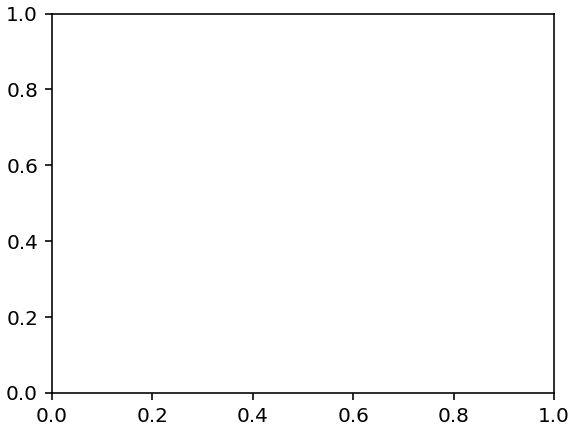

Merged g2 functions:  [0.5] (exposure times)
                      [1] (number of correlation functions)
                      [1990] (total number of images)


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [44]:
fig2, axs2 = plt.subplots(1, 1, figsize=(4,3), constrained_layout=True)
# fig, axs = plt.subplots(1, 1, figsize=(2.8,5), constrained_layout=True)

taus, alphas = np.ones(shape=(len(T),2)), np.ones(shape=(len(T),2))
col = plt.cm.coolwarm_r(np.linspace(0,1,len(inds_xpcs_sorted)))
off = .4

for i,ind in enumerate(inds_xpcs_sorted[:1]):
    qv_sel = 1
    phi = good_angle[i]
#     g, pars = plot_many_qs_one_phi_2(d, ind, nq, nangles, qv_phi, qv, qv_sel=qv_sel, phi=phi, rescale=True, dofit=1, 
#                          axs=axs2, col=col[i], temp=T[i])#, title=f'T={T[i]} K')
    g, pars = plot_many_qs_one_phi_3(d, ind, nq, nangles, qv_phi, qv, phi=phi, rescale=True, dofit=1, 
                         axs=axs2, col=col[i], temp=T[i])#, title=f'T={T[i]} K')
    
    if phi == 0: q_sel = 2
    elif phi == 90: q_sel = 3
    else: print("Unknown qv")

    t = g.corrFuncRescaled[0][0][1:,0]
    qv = g.corrFuncRescaled[0][0][0, 1:]
    g2 = g.corrFuncRescaled[0][0][1:,1:]
    dg2 = g.corrFuncRescaled[0][1][1:,1:]

#     f = log_interp1d(t[:-1], g2[:-1,q_sel]-1)
#     df = log_interp1d(t[:-1], dg2[:-1,q_sel])
    
#     t_log = np.logspace(0, np.log10(t[-1]), num=25)
#     print(np.shape(f(t_log)))

#     axs.errorbar(t_log, f(t_log)+off*i, yerr=df(t_log), ls='', marker='o', ms=6, fillstyle='none', c=col[i], alpha=1)
    
    y_fit = pars['beta'].values[0] * np.exp(-2*(t/pars['t0'].values[0])**pars['g0'].values[0] ) + pars['a'].values[0]
    
    
    axs.plot(t, g2[:,q_sel]-1, ls='',marker='o',ms=4,fillstyle='none',c=col[i],alpha=.7)
    axs.errorbar(t, g2[:,q_sel]-1, yerr=dg2[:,q_sel],ls='',marker='o',ms=4,fillstyle='none',c=col[i],alpha=.7)
    
    axs.plot(t, y_fit-1, ls='-', c=col[i], label=f'{T[i]} K', alpha=1)
    
axs2.grid(ls=':',color='gray',alpha=.5)
axs2.set_ylim(0.9,2.1)
axs2.set_xlim(1,1000)
axs2.set_xscale('log')
axs2.minorticks_on()

axs.grid(ls=':',color='gray',alpha=.5)
axs.set_xlabel('t (s)', fontsize=12)
# axs.set_ylabel(r'($\rm g_2$(t)-1) / $\beta$', fontsize=14)
axs.set_ylabel(r'$(g_2(t) - 1)\, /\,\beta$', fontsize=12)
# axs[1].set_ylim(0.9,1.2)
axs.set_xlim(1,1000)
axs.set_ylim(0,5.5)
# axs.legend(frameon=False, bbox_to_anchor=[1.1,1], handlelength=0.6)
axs.text(0.1,0.13, '290 K', transform=axs.transAxes)
axs.text(0.8,0.95, '180 K', transform=axs.transAxes)
axs.set_xscale('log')
# axs.minorticks_on()

# fig.savefig("../09-plots/fig3-b-tall.png", dpi=300)
fig.show()

**End of prep**

In [44]:
# -- save in csv 

for key in fig2c:
    print(key, np.shape(fig2c[key]))
    
# create dataframe from dictionary
df2c = pd.DataFrame(fig2c)

# write csv from dataframe
df2c.to_csv('../csv/Figure2c.csv', index=False)

# load
rcsv = pd.read_csv('../csv/Figure2c.csv')
rcsv

q (1/nm) (70,)
g2(t) T=290 K (70,)
g2(t) err T=290 K (70,)
g2(t) T=280 K (70,)
g2(t) err T=280 K (70,)
g2(t) T=270 K (70,)
g2(t) err T=270 K (70,)
g2(t) T=260 K (70,)
g2(t) err T=260 K (70,)
g2(t) T=250 K (70,)
g2(t) err T=250 K (70,)
g2(t) T=240 K (70,)
g2(t) err T=240 K (70,)
g2(t) T=230 K (70,)
g2(t) err T=230 K (70,)
g2(t) T=220 K (70,)
g2(t) err T=220 K (70,)
g2(t) T=210 K (70,)
g2(t) err T=210 K (70,)
g2(t) T=200 K (70,)
g2(t) err T=200 K (70,)
g2(t) T=190 K (70,)
g2(t) err T=190 K (70,)
g2(t) T=180 K (70,)
g2(t) err T=180 K (70,)


,q (1/nm),g2(t) T=290 K,g2(t) err T=290 K,g2(t) T=280 K,g2(t) err T=280 K,g2(t) T=270 K,g2(t) err T=270 K,g2(t) T=260 K,g2(t) err T=260 K,g2(t) T=250 K,...,g2(t) T=220 K,g2(t) err T=220 K,g2(t) T=210 K,g2(t) err T=210 K,g2(t) T=200 K,g2(t) err T=200 K,g2(t) T=190 K,g2(t) err T=190 K,g2(t) T=180 K,g2(t) err T=180 K
0,0.503000,1.000000,0.010573,1.000000,0.007822,1.000000,0.009220,1.000000,0.010008,1.000000,...,1.000000,0.015379,1.000000,0.013046,1.000000,0.018011,1.000000,0.024140,1.000000,0.081242
1,1.006000,1.000737,0.010582,0.999408,0.007821,0.997645,0.009206,1.002818,0.010008,1.000539,...,0.995844,0.015377,1.000640,0.013050,1.002711,0.018038,0.996746,0.024154,0.996751,0.081152
2,1.509000,0.995663,0.010593,0.997049,0.007828,0.993756,0.009208,0.994382,0.009994,0.999765,...,0.994414,0.015374,1.008459,0.013039,0.994803,0.018023,1.001695,0.024170,0.995152,0.081166
3,2.012000,0.996469,0.010587,0.998367,0.007826,0.999967,0.009218,0.996580,0.010001,0.997195,...,0.995570,0.015379,1.000024,0.013042,1.000635,0.018033,1.004478,0.024164,0.999318,0.081186
4,2.515000,1.002140,0.010579,0.993735,0.007826,0.992660,0.009215,0.998381,0.010003,0.997750,...,0.986408,0.015374,0.998583,0.013053,0.992064,0.018028,1.001160,0.024170,0.995877,0.081214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,643.840027,0.002748,0.009737,0.003519,0.006990,0.006809,0.008480,0.025618,0.008674,-0.004491,...,0.014374,0.013628,0.060210,0.011043,0.154451,0.015772,0.132217,0.021262,0.278923,0.078384
66,708.223999,0.000910,0.010372,0.002340,0.007446,0.003260,0.009102,0.017510,0.009162,-0.001617,...,0.006112,0.014123,0.036198,0.011158,0.096713,0.015433,0.073331,0.020875,0.192042,0.077733
67,772.608032,-0.002009,0.011206,0.001463,0.007988,0.001326,0.009958,0.008477,0.009668,0.001534,...,0.001363,0.014203,0.012491,0.011560,0.042397,0.015198,0.035663,0.020694,0.096621,0.077020
68,836.992065,0.000000,0.012335,0.000000,0.008618,0.000000,0.010864,0.000000,0.010332,0.000000,...,0.000000,0.014779,0.000000,0.012174,0.000000,0.015237,0.000000,0.020534,0.000000,0.076124


<IPython.core.display.Javascript object>


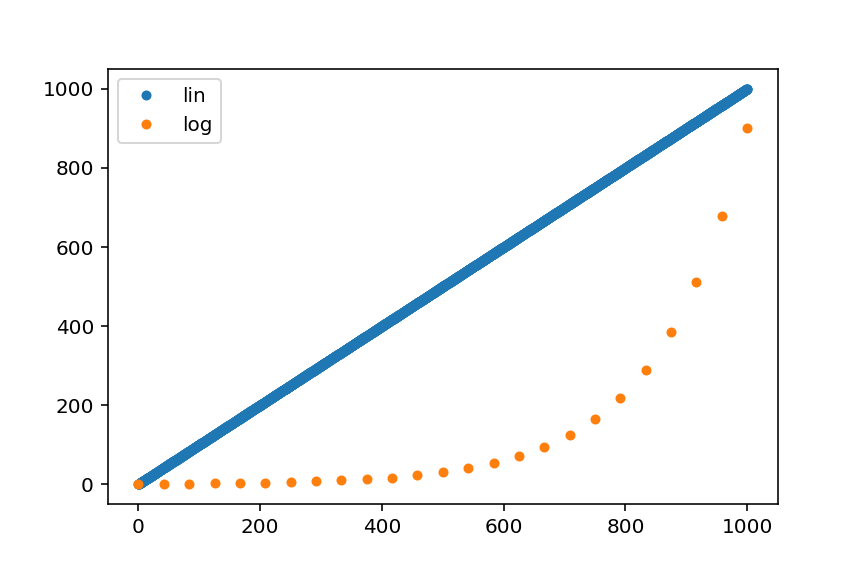

In [45]:
t_log = np.logspace(0, np.log10(t[-1]), num=25)
t_lin = np.linspace(0, 1000, 2000)

plt.figure()
plt.plot(t_lin, t_lin, label='lin', ls='', marker='o', ms=4)
plt.plot(np.linspace(0, 1000, 25), t_log, label='log', ls='', marker='o', ms=4)
plt.legend()
plt.show()

`dict_keys(['corf', 'dcorf', 'trace', 'qv', 'qroi', 'Isaxs', 'mask', 'twotime_corf', 'twotime_par', 'twotime_xy', 'chi4', 'xtwotime_corf', 'xchi4'])`

# Only Chi4

In [46]:
from scipy.ndimage import gaussian_filter
from scipy.optimize import curve_fit

In [47]:
def fit(function,x,y,p0=None,sigma=None,bounds=[None,None],xc_len=False):
    '''
    fits a function and return the fit resulting parameters and curve
    '''
    popt,pcov = curve_fit(function,x,y,p0=p0,sigma=sigma,bounds=bounds)
    if xc_len: xc = np.linspace(min(x),max(x),100)
    else: xc = np.linspace(min(x),max(x),len(x))
    curve = function(xc,*popt)
    perr = np.sqrt(np.diag(pcov))
    return popt,xc,curve,perr

def gaussian(x, a, x0, sigma, d):
    return a*np.exp(-(x-x0)**2/(2*sigma**2)) + d

<IPython.core.display.Javascript object>


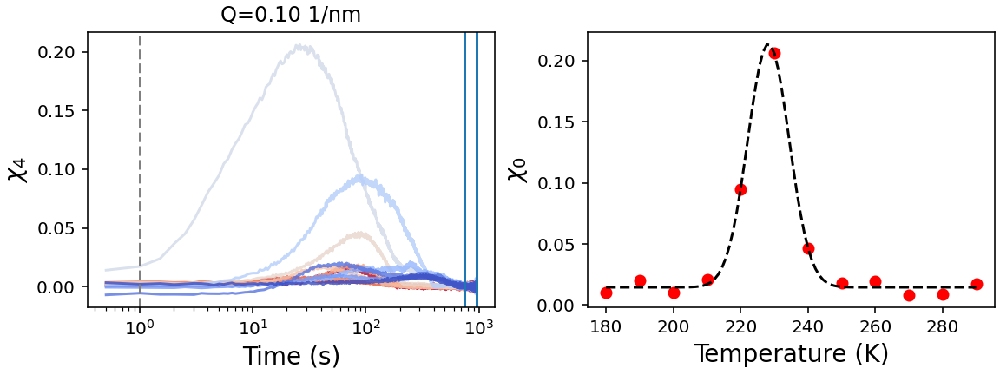

Max of Chi0:  227.77777777777777


In [48]:
f, (a1,a2) = plt.subplots(1,2, figsize=(8,3), constrained_layout=True)

col = plt.cm.coolwarm_r(np.linspace(0,1,len(inds_xpcs_sorted)))
t_min, t_max = 300, -60
chi0 = []
chis = np.empty(shape=(len(inds_xpcs_sorted), 1988))
xchis = np.empty(shape=(len(inds_xpcs_sorted), 1988))
iind = 0
skip = -100

for i,ind in enumerate(inds_xpcs_sorted[:]):
    phi = good_angle[i]
    tmp = d.get_item(ind)
    
    if phi == 0: q_sel = 2
    elif phi == 90: q_sel = 3
    else: print("Unknown qv")
        
    chi4 = tmp['chi4'][q_sel]
    ttc = tmp['twotime_corf'][q_sel]
    trace = tmp["trace"][:,q_sel]
#     print(np.shape(trace))
#     print(tmp.keys())
    
    xtime = tmp['twotime_xy']
    del tmp
    
    norm = len(chi4[:,iind])
#     print("avg intensity: ", norm**2, '\n')
    
    chis[i,:] = chi4[:,iind] / norm
    xchis[i,:] = xtime[1:-1]
    
#     y = (chi4[:,iind] - chi4[0,iind]) / norm
    y = (chi4[:,iind] - np.average(chi4[-500:skip,iind])) / norm
    y = y[:skip]
    
    a1.plot(xtime[1:-1+skip], y, c=col[i], alpha=.8,label=f'{T[i]} K')
    chi0.append(np.max(y))

a1.axvline(x=xtime[2], c='gray', ls='--')

a2.plot(T, chi0, marker='o', c='r', ls='')
popt,xc,curve,perr = fit(gaussian, T, chi0, p0=[400,230,10,70],xc_len=True)
print("Max of Chi0: ",xc[np.argmax(curve)])
a2.plot(xc,curve,ls='--', c='k')
a1.axvline(x=xtime[skip])
a1.axvline(x=xtime[-500])
a1.set_title(f'Q={qv[q_sel]:.2f} 1/nm')
a1.set_xscale('log')
# a1.legend(handlelength=.5, ncol=1, bbox_to_anchor=[1.05,1.1])
a1.set_xlabel('Time (s)', fontsize=14)
a1.set_ylabel(r'$\chi_4$', fontsize=14)
a2.set_xlabel('Temperature (K)', fontsize=14)
a2.set_ylabel(r'$\chi_0$', fontsize=14)
# a1.set_ylim(0,1)
# f.savefig('../09-plots/chi4.png', dpi=300)
f.show()

In [52]:
# np.savez('../02-sources/cmws_chi', chi_0=chi0, temp=T, fit_x=xc, fit_y=curve)

In [51]:
!ls ../02-sources

elog			HydLys_0p25_1_00001.fio  img_1_.npy
fit_params_h25_LLT.npz	img_1000.npy		 img_avg_blank.npy
fit_params_h25_old.npz	img_100_blank.npy	 img_avg.npy
fit_pars_Temps.pkl	img_100.npy		 waxs_temps.npz


### My $\chi_4$

In [59]:
def vartrc(ttc):
    """Calculate the variance of the two-time correlation function."""
    n, tmp = np.shape(ttc)
    ttc_var = []
    for i in range(1, n - 1):
        ttc_var.append(np.var(np.diag(ttc, i)))
    return ttc_var

In [60]:
import matplotlib as mpl

<IPython.core.display.Javascript object>


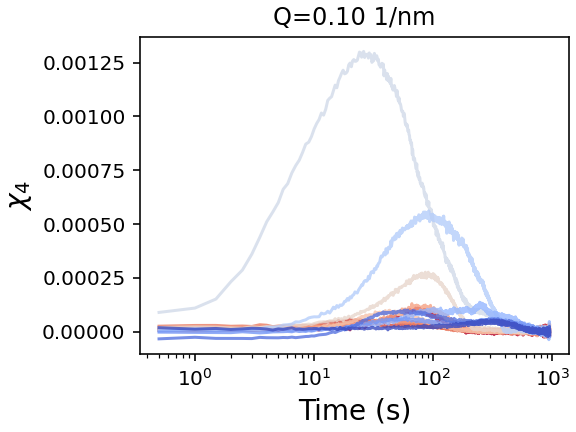

<IPython.core.display.Javascript object>


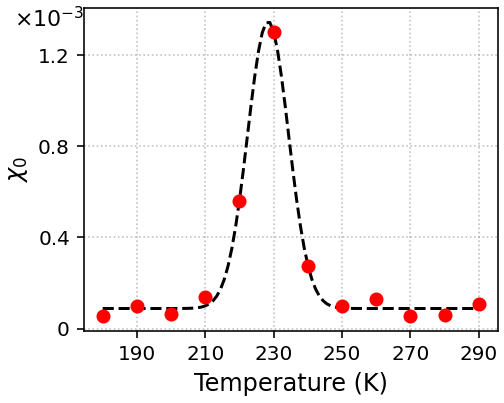

HERE:  26.156001091003418


In [62]:
f1, a1 = plt.subplots(1,1, figsize=(4,3), constrained_layout=True)
f2, a2 = plt.subplots(1,1, figsize=(3.5,2.8), constrained_layout=True)

col = plt.cm.coolwarm_r(np.linspace(0,1,len(inds_xpcs_sorted)))

chi0 = []
chis = np.empty(shape=(len(inds_xpcs_sorted), 1988))
xchis = np.empty(shape=(len(inds_xpcs_sorted), 1988))
skip = -100

for i,ind in enumerate(inds_xpcs_sorted[:]):
    phi = good_angle[i]
    tmp = d.get_item(ind)
    
    if phi == 0: q_sel = 2
    elif phi == 90: q_sel = 3
    else: print("Unknown qv")
        
    ttc = tmp['twotime_corf'][q_sel]
    xtime = tmp['twotime_xy']
    del tmp
    
    chi4 = vartrc(ttc)
    chi4 /= np.average(ttc)**2

    y = chi4[:] - np.average(chi4[-500:-100])
    chis[i,:] = y
    xchis[i,:] = xtime[1:-1]
    
    chi0.append(np.max(chis[i,:skip]))
    
    a1.plot(xchis[i,:skip], chis[i,:skip], c=col[i], alpha=.8, label=f'{T[i]} K')
    
    if T[i]==230:
        print("HERE: ",xchis[i, np.argmax(chis[i,:skip])])
    
popt,xc,curve,perr = fit(gaussian, T, chi0, p0=[400,230,10,70],xc_len=True)
a2.plot(xc,curve,ls='--', c='k')
a2.plot(T, chi0, marker='o', c='r', ls='')

# mpl.rcParams['axes.linewidth'] = .5 #set the value globally
# [i.set_linewidth(0.1) for i in a2.spines.itervalues()]

# a1.axvline(x=xtime[skip])
# a1.axvline(x=xtime[-500])
a1.set_title(f'Q={qv[q_sel]:.2f} 1/nm')
a1.set_xscale('log')
# a1.legend(handlelength=.5, ncol=1, bbox_to_anchor=[1.05,1.1])
a1.set_xlabel('Time (s)', fontsize=14)
a1.set_ylabel(r'$\chi_4$', fontsize=14)
a2.set_xlabel('Temperature (K)', fontsize=12)
a2.set_ylabel(r'$\chi_0$', fontsize=12)
a2.set_yticks(np.arange(0,1.3e-3,.4e-3), [0,0.4,0.8,1.2])
a2.set_xticks(np.arange(190,291,20))
a2.annotate(r'$\times10^{-3}$', xy=(-.17,.94), xycoords='axes fraction', fontsize=11)

a2.grid(ls=':',color='gray',alpha=.5)

# a1.set_ylim(0,1)
f2.savefig('../09-plots/chi0.png', dpi=900)
f1.show()
f2.show()

In [52]:
# -- save in csv file
fig3b = {}
chi0 = []
chis = np.empty(shape=(len(inds_xpcs_sorted), 1988))
xchis = np.empty(shape=(len(inds_xpcs_sorted), 1988))
skip = -100

for i,ind in enumerate(inds_xpcs_sorted[:]):
    phi = good_angle[i]
    tmp = d.get_item(ind)
    
    if phi == 0: q_sel = 2
    elif phi == 90: q_sel = 3
    else: print("Unknown qv")
        
    ttc = tmp['twotime_corf'][q_sel]
    xtime = tmp['twotime_xy']
    del tmp
    
    chi4 = vartrc(ttc)
    chi4 /= np.average(ttc)**2

    y = chi4[:] - np.average(chi4[-500:-100])
    chis[i,:] = y
    xchis[i,:] = xtime[1:-1]
    
    chi0.append(np.max(chis[i,:skip]))
    
    if i==0: fig3b[f'time (s)'] = xchis[i,:skip]
    fig3b[f'Chi_T T={T[i]} K'] = chis[i,:skip]
    
a2.plot(xc,curve,ls='--', c='k')
a2.plot(T, chi0, marker='o', c='r', ls='')

fig3c = {'Temperature (K)': T,
         'Chi_0': chi0
        }

In [53]:
for key in fig3b:
    print(key, np.shape(fig3b[key]))
    
for key in fig3c:
    print(key, np.shape(fig3c[key]))

time (s) (1888,)
Chi_T T=290 K (1888,)
Chi_T T=280 K (1888,)
Chi_T T=270 K (1888,)
Chi_T T=260 K (1888,)
Chi_T T=250 K (1888,)
Chi_T T=240 K (1888,)
Chi_T T=230 K (1888,)
Chi_T T=220 K (1888,)
Chi_T T=210 K (1888,)
Chi_T T=200 K (1888,)
Chi_T T=190 K (1888,)
Chi_T T=180 K (1888,)
Temperature (K) (12,)
Chi_0 (12,)


In [54]:
df2b = pd.DataFrame(fig3b)
df2b.to_csv("../csv/Figure3b.csv", index=False)
rcsv = pd.read_csv('../csv/Figure3b.csv')
rcsv

,time (s),Chi_T T=290 K,Chi_T T=280 K,Chi_T T=270 K,Chi_T T=260 K,Chi_T T=250 K,Chi_T T=240 K,Chi_T T=230 K,Chi_T T=220 K,Chi_T T=210 K,Chi_T T=200 K,Chi_T T=190 K,Chi_T T=180 K
0,0.50300,0.000007,0.000005,0.000025,1.964522e-05,0.000007,0.000019,8.887563e-05,6.593560e-06,0.000001,-0.000003,-0.000034,0.000018
1,1.00600,0.000009,0.000003,0.000028,1.090288e-05,0.000006,0.000021,1.090378e-04,1.228089e-05,0.000009,-0.000004,-0.000027,0.000011
2,1.50900,0.000016,0.000004,0.000028,1.011297e-05,0.000006,0.000021,1.510275e-04,1.120105e-05,0.000003,-0.000004,-0.000032,0.000014
3,2.01200,0.000006,0.000005,0.000025,1.814828e-05,0.000012,0.000017,2.312325e-04,7.068178e-06,0.000007,-0.000005,-0.000032,0.000010
4,2.51500,0.000015,0.000005,0.000026,1.349124e-05,0.000009,0.000015,2.856675e-04,1.020120e-05,0.000005,-0.000001,-0.000032,0.000012
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1883,947.65204,-0.000011,0.000003,-0.000009,2.707675e-07,-0.000003,0.000014,-4.822941e-06,1.719592e-05,-0.000005,-0.000012,-0.000005,-0.000009
1884,948.15504,0.000012,0.000005,0.000009,-1.441600e-06,-0.000006,-0.000018,8.061179e-07,1.251420e-05,0.000007,-0.000013,-0.000004,-0.000005
1885,948.65804,-0.000024,-0.000004,-0.000009,3.580657e-05,-0.000013,0.000015,-1.401423e-05,5.628295e-06,-0.000023,-0.000006,-0.000007,0.000004
1886,949.16104,0.000014,0.000006,0.000001,-6.317197e-06,-0.000012,-0.000008,-1.703439e-05,6.458940e-07,-0.000006,-0.000004,-0.000002,-0.000006


In [55]:
df2c = pd.DataFrame(fig3c)
df2c.to_csv("../csv/Figure3c.csv", index=False)
rcsv = pd.read_csv('../csv/Figure3c.csv')
rcsv

,Temperature (K),Chi_0
0,290,0.000109
1,280,0.000059
2,270,0.000056
3,260,0.000130
4,250,0.000099
5,240,0.000276
6,230,0.001303
7,220,0.000560
8,210,0.000136
9,200,0.000065


**Sort of Q-dependence of the $\chi_4$**

<IPython.core.display.Javascript object>


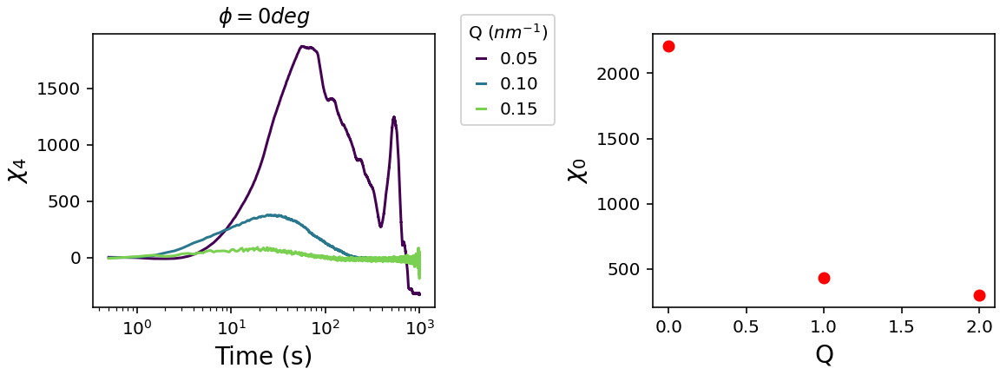

In [56]:
f, (a1,a2) = plt.subplots(1,2, figsize=(8,3), constrained_layout=True)

col = plt.cm.coolwarm_r(np.linspace(0,1,len(inds_xpcs_sorted)))
col2 = plt.cm.viridis(np.linspace(0,1,6))
t_min, t_max = 300, -60
chi0_ = []

for i,ind in enumerate(inds_xpcs_sorted[:]):
    phi = good_angle[i]
    tmp = d.get_item(ind)
    
    if phi == 0: q_sel = 2
    elif phi == 90: q_sel = 3
    else: print("Unknown qv")
    
    chi4 = tmp['chi4']
    xtime = tmp['twotime_xy']
    del tmp
    
    if T[i]==230:
        for j in list(chi4.keys())[::2]:
            yy = chi4[j][:,0] - np.average(chi4[j][:2,0])
            a1.plot(xtime[1:-1], yy, c=col2[j],label=f'{qv[j]:.2f}')
            chi0_.append(np.max(chi4[j][:,0]))
        
# a1.axvline(x=xtime[2], c='gray', ls='--')
a2.plot(chi0_, marker='o', c='r', ls='')
if phi==0: a1.set_title(f'$\phi=0 deg$')
elif phi==90: a1.set_title(f'$\phi=90 deg$')
a1.set_xscale('log')
# a1.set_ylim(-.2,1.2)
a1.legend(title=r'Q ($nm^{-1}$)', handlelength=.5, ncol=1, bbox_to_anchor=[1.05,1.1])
a1.set_xlabel('Time (s)', fontsize=14)
a1.set_ylabel(r'$\chi_4$', fontsize=14)
a2.set_xlabel('Q', fontsize=14)
a2.set_ylabel(r'$\chi_0$', fontsize=14)

f.show()

**WTF is the other index**

<IPython.core.display.Javascript object>


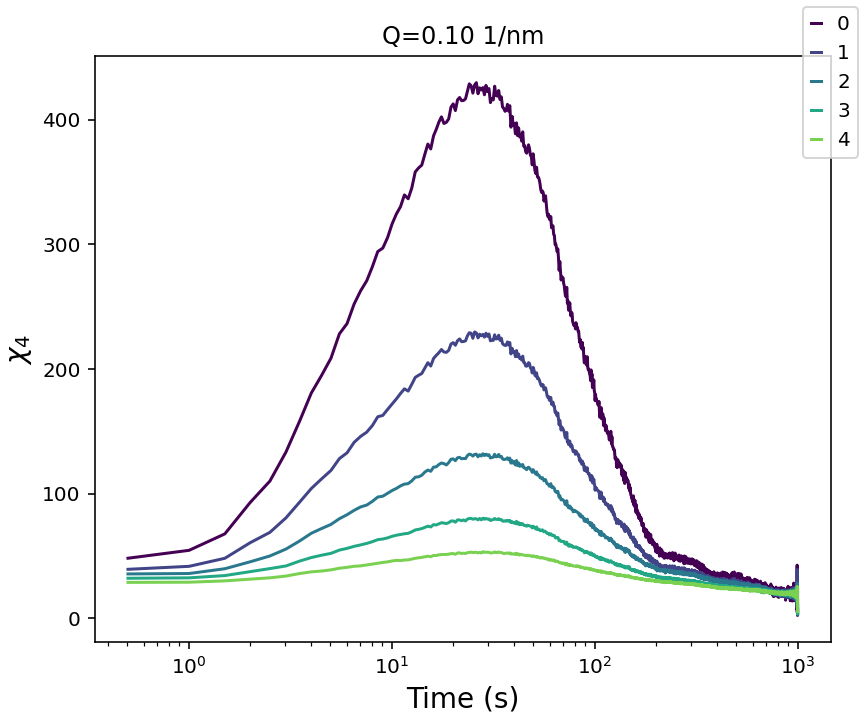

In [57]:
f, a1 = plt.subplots(1,1, figsize=(6,5), constrained_layout=True)
col2 = plt.cm.viridis(np.linspace(0,1,6))
t_min, t_max = 300, -60

for i,ind in enumerate(inds_xpcs_sorted[:]):
    phi = good_angle[i]
    tmp = d.get_item(ind)
    
    if phi == 0: q_sel = 2
    elif phi == 90: q_sel = 3
    else: print("Unknown qv")
    
    chi4 = tmp['chi4']
    xtime = tmp['twotime_xy']
    del tmp
    
    if T[i]==230:
        for k in range(5):
            a1.plot(xtime[1:-1], chi4[q_sel][:,k], c=col2[k],label=k)

a1.set_title(f'Q={qv[q_sel]:.2f} 1/nm')
a1.set_xscale('log')
a1.legend(handlelength=.5, ncol=1, bbox_to_anchor=[1.05,1.1])
a1.set_xlabel('Time (s)', fontsize=14)
a1.set_ylabel(r'$\chi_4$', fontsize=14)

f.show()

**3D plot**

In [58]:
from mpl_toolkits.mplot3d import Axes3D

<IPython.core.display.Javascript object>


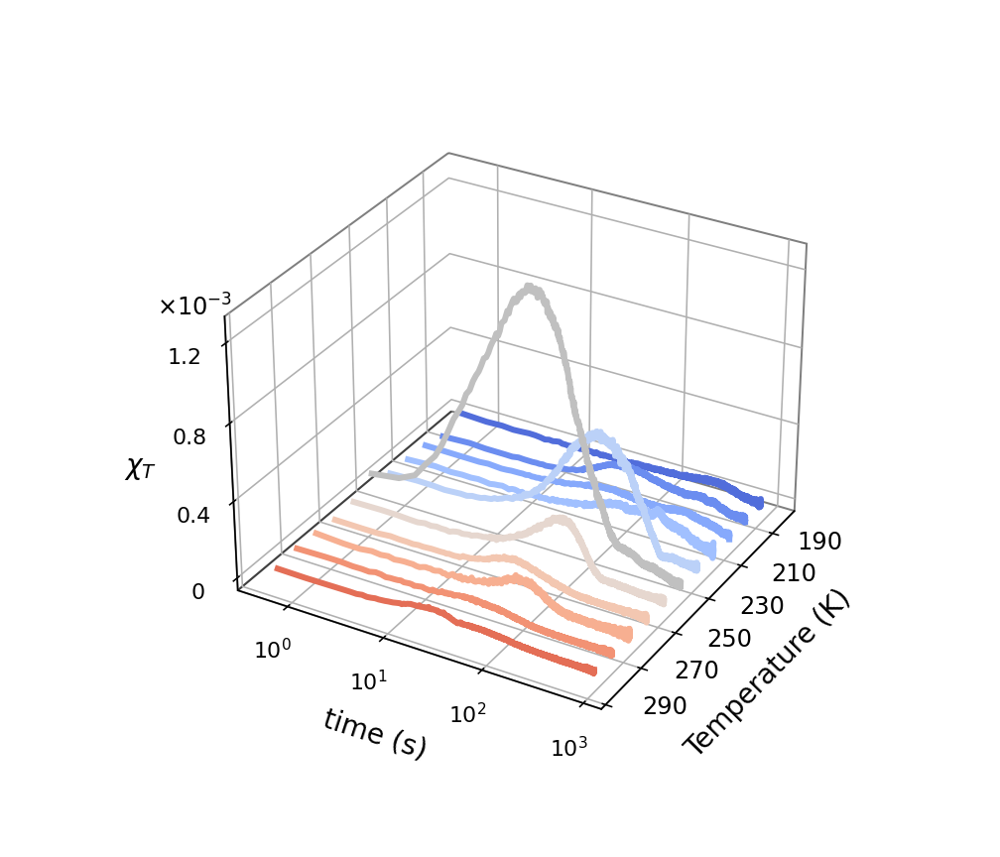

In [59]:
fig = plt.figure(figsize=(7,6), facecolor='white',edgecolor='w')#, tight_layout=True)
ax = fig.add_subplot(111, projection='3d')
ax.set_facecolor("white")

col = plt.cm.coolwarm_r(np.linspace(0,1,len(T)+2))
skip = -100
xoff = 3

for i in range(len(T)-1,0,-1):
    y = np.log(xchis[i,:])
    x = np.ones(len(y))*T[i]
    z = chis[i,:] - np.average(chis[i,-500:-100])
    
    if T[i] == 230:
#         ax.plot(x[:skip], y[:skip], z[:skip], c='gray', lw=3, alpha=.5)
        ax.plot(x[:skip]+xoff, y[:skip], z[:skip], c='silver', lw=3, alpha=1)
    else:
        ax.plot(x[:skip]+xoff, y[:skip], z[:skip], c=col[i+1], lw=3, alpha=1)
#     ax.plot(x[:skip], y[:skip], z[:skip], c=col[i+1], ls='', marker='o', alpha=.9, mec='k', mew=.1, ms=4)
    
ax.view_init(elev=30,azim=30)
# ax.set_proj_type('persp')  #persp def, ortho

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
ax.xaxis.pane.set_edgecolor('k')
ax.yaxis.pane.set_edgecolor('k')
ax.zaxis.pane.set_edgecolor('k')
# ax.grid(ls='-', c='k', alpha=1)

ax.set_yticks(np.linspace(0,7,4),labels=["10$^0$","10$^1$","10$^2$","10$^3$"])
ax.set_xticks(T[::2], ['']*len(T[::2]))
ax.set_zticks(np.arange(0,1.3e-3,.4e-3), [0,0.4,0.8,1.2])
ax.annotate(r'$\times10^{-3}$', xy=(-.05,.67), xycoords='axes fraction', fontsize=12)

ax.annotate('290', xy=(.7,.055), xycoords='axes fraction', fontsize=12)
ax.annotate('270', xy=(.75,.11), xycoords='axes fraction', fontsize=12)
ax.annotate('250', xy=(.8,.16), xycoords='axes fraction', fontsize=12)
ax.annotate('230', xy=(.85,.21), xycoords='axes fraction', fontsize=12)
ax.annotate('210', xy=(.9,.26), xycoords='axes fraction', fontsize=12)
ax.annotate('190', xy=(.94,.31), xycoords='axes fraction', fontsize=12)

ax.set_ylabel(r'time (s)', fontsize=14, labelpad=10)
ax.set_xlabel('Temperature (K)', fontsize=14, labelpad=10)
ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel(r'$\chi_T$', fontsize=14, labelpad=5)
ax.tick_params(which='major', labelsize=11)
# ax.set_axis_off()
# for axis in [ax.xaxis, ax.yaxis, ax.zaxis]:
# #     axis.set_ticklabels([])
#     axis._axinfo['axisline']['linewidth'] = 1
#     axis._axinfo['axisline']['color'] = "k"
#     axis._axinfo['grid']['linewidth'] = 1
#     axis._axinfo['grid']['linestyle'] = ":"
#     axis._axinfo['grid']['color'] = "#d1d1d1"
#     axis._axinfo['tick']['inward_factor'] = 0.0
#     axis._axinfo['tick']['outward_factor'] = 0.0
#     axis.set_pane_color((0, 0, 0))
# ax2 = fig.add_subplot(122, projection='3d')

fig.tight_layout()
# fig.savefig("../09-plots/chi4_3d.png", dpi=600)
fig.show()


**Tau from Chi4**

<IPython.core.display.Javascript object>


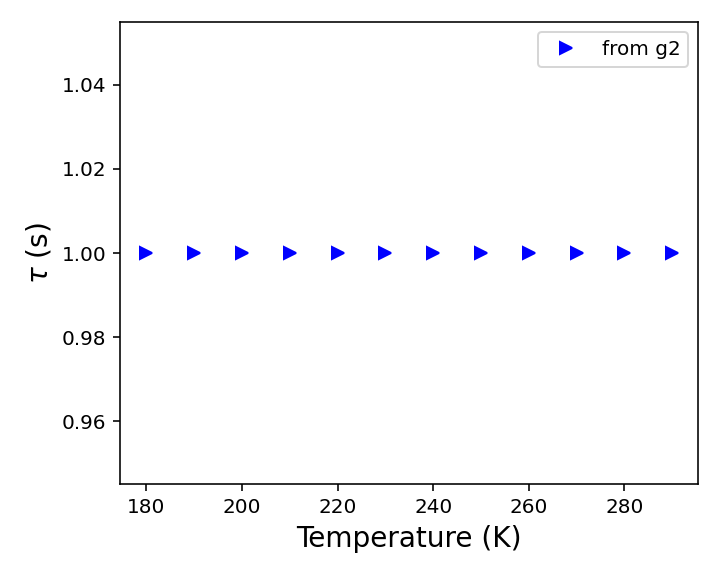

In [60]:
plt.figure(figsize=(5,4))

# plt.plot(T, chi4_tau, marker='o', ls='', c='r', label=r'from Chi4')
plt.plot(T, taus[:,0], marker='>', ls='', c='b', label='from g2')

plt.legend()
plt.xlabel('Temperature (K)', fontsize=14)
plt.ylabel(r'$\tau$ (s)', fontsize=14)
plt.tight_layout()
# plt.savefig('../09-plots/taus.png', dpi=300)
plt.show()

**Save in npz file**

In [61]:
!ls ../02-sources

elog			HydLys_0p25_1_00001.fio  img_1_.npy
fit_params_h25_LLT.npz	img_1000.npy		 img_avg_blank.npy
fit_params_h25_old.npz	img_100_blank.npy	 img_avg.npy
fit_pars_Temps.pkl	img_100.npy		 waxs_temps.npz


In [62]:
# np.savez('../02-sources/fit_params_h25_LLT', temp=T, 
#          tau=taus[:,0], dtau=taus[:,1], alpha=alphas[:,0], dalpha=alphas[:,1])

In [63]:
f = np.load("../02-sources/fit_params_h25_LLT.npz")
keys = list(f.files)

ciao maddalena come stai ? io tutto bene te ? ti ho gia chiesti cine stai pwr caso? buon natale a tre e famiglia!


# SAXS

In [64]:
inds_saxs = d.db[(d.db['sample'] == sample) 
           & (d.db['analysis']=='saxs')
            & (d.db.index.values > 7 )
            & (d.db['series'] != 4 )
                 & (d.db.index.values < 64 )
               ].index.values
display(d.db.loc[inds_saxs])

,use,sample,analysis,series,subset,t_delay,t_exposure,t_readout,nframes,first,last,master,datdir,mod,savname,savfile,setupfile,comment
9,True,HydLys_0p25_2,saxs,3,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-08 17:01:21.884760,s0003_0009.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
13,True,HydLys_0p25_2,saxs,6,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-09 11:34:26.810100,s0006_0013.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
15,True,HydLys_0p25_2,saxs,7,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-09 11:51:51.739624,s0007_0015.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
17,True,HydLys_0p25_2,saxs,8,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-09 12:01:03.484563,s0008_0017.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
19,True,HydLys_0p25_2,saxs,9,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-09 12:13:50.291399,s0009_0019.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
21,True,HydLys_0p25_2,saxs,11,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-09 13:25:44.202365,s0011_0021.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
23,True,HydLys_0p25_2,saxs,12,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-09 14:54:23.759385,s0012_0023.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
25,True,HydLys_0p25_2,saxs,5,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-10 10:36:56.762274,s0005_0025.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
27,True,HydLys_0p25_2,saxs,10,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-10 10:43:38.084875,s0010_0027.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,
29,True,HydLys_0p25_2,saxs,13,0,0.503,0.5,0.00001,1990,10,1999,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,/asap3/petra3/gpfs/p10/2022/data/11014696/raw/...,2022-11-10 11:00:40.703492,s0013_0029.pkl,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,/asap3/petra3/gpfs/p10/2022/data/11014696/proc...,


In [65]:
series_n2 = d.db.loc[inds_saxs, 'series'].values
inds_saxs_sorted = [x for _,x in sorted(zip(series_n2, inds_saxs))]

In [66]:
series_ns2 = d.db.loc[inds_saxs_sorted, 'series'].values
series_ns2

array([3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], dtype=object)

In [67]:
T = np.array(sub_elog['Target temperature (K)'].values, dtype=int)
T

array([290, 280, 270, 260, 250, 240, 230, 220, 210, 200, 190, 180])

In [68]:
len(T), len(inds_saxs_sorted)

(12, 12)

<IPython.core.display.Javascript object>


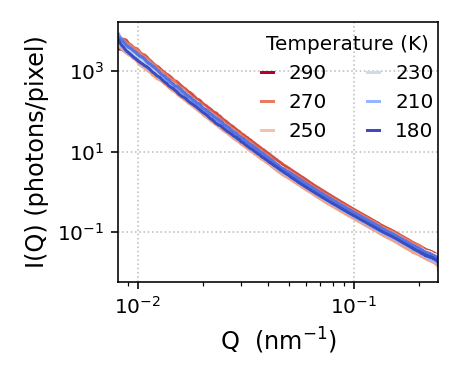

In [69]:
plt.figure(figsize=(3.2,2.7))
col = plt.cm.coolwarm_r(np.linspace(0,1,len(T)))

for i,ind in enumerate(inds_saxs_sorted):
    tmp = d.get_item(ind)
    
    q = tmp['soq'][:,0]
    Iq = tmp['soq'][:,1]
    dIq = tmp['soq'][:,2]
    del tmp
    
#     plt.errorbar(q, Iq/np.max(Iq), yerr=dIq, c=col[i], marker='o',ms=1, label=T[i])
#     plt.plot(q, Iq/np.max(Iq), c=col[i], label=T[i])
    if i in [0,2,4,6,8,len(T)-1]:
        plt.plot(q, Iq, c=col[i], label=T[i])
    else:
        plt.plot(q, Iq, c=col[i])

plt.grid(ls=':', c='gray', alpha=.5)
plt.xlabel(r'Q  ($\rm nm^{-1}$)', fontsize=12)
plt.ylabel(r'I(Q) (photons/pixel)', fontsize=12)
plt.xscale('log')
plt.yscale('log')
# plt.ylim(1e-2,1e4)
plt.xlim(q[0],q[-1])
plt.legend(title='Temperature (K)', handlelength=.6, ncol=2, frameon=False, fontsize=10, loc=(.42,.51))
plt.tight_layout()
# plt.savefig('../09-plots/saxs.png', dpi=300)
plt.show()

In [70]:
# -- save in csv 
fig2b = {}

for i,ind in enumerate(inds_saxs_sorted):
    tmp = d.get_item(ind)
    
    q = tmp['soq'][:,0]
    Iq = tmp['soq'][:,1]
    dIq = tmp['soq'][:,2]
    del tmp

    if i == 0:
        fig2b['q (1/nm)'] = q
    fig2b[f'Iq T={T[i]} K (ph/pix/frame)'] = Iq

for key in fig2b:
    print(key, np.shape(fig2b[key]))
    
# create dataframe from dictionary
df2a = pd.DataFrame(fig2b)

# write csv from dataframe
df2a.to_csv('../csv/Figure2b.csv', index=False)

# load
rcsv = pd.read_csv('../csv/Figure2b.csv')
rcsv

q (1/nm) (1000,)
Iq T=290 K (ph/pix/frame) (1000,)
Iq T=280 K (ph/pix/frame) (1000,)
Iq T=270 K (ph/pix/frame) (1000,)
Iq T=260 K (ph/pix/frame) (1000,)
Iq T=250 K (ph/pix/frame) (1000,)
Iq T=240 K (ph/pix/frame) (1000,)
Iq T=230 K (ph/pix/frame) (1000,)
Iq T=220 K (ph/pix/frame) (1000,)
Iq T=210 K (ph/pix/frame) (1000,)
Iq T=200 K (ph/pix/frame) (1000,)
Iq T=190 K (ph/pix/frame) (1000,)
Iq T=180 K (ph/pix/frame) (1000,)


,q (1/nm),Iq T=290 K (ph/pix/frame),Iq T=280 K (ph/pix/frame),Iq T=270 K (ph/pix/frame),Iq T=260 K (ph/pix/frame),Iq T=250 K (ph/pix/frame),Iq T=240 K (ph/pix/frame),Iq T=230 K (ph/pix/frame),Iq T=220 K (ph/pix/frame),Iq T=210 K (ph/pix/frame),Iq T=200 K (ph/pix/frame),Iq T=190 K (ph/pix/frame),Iq T=180 K (ph/pix/frame)
0,0.008151,3593.396729,6316.837891,7054.828613,4183.965332,4309.501465,8141.428223,5385.525879,8689.864258,4933.841309,8202.877930,6897.367188,6056.687988
1,0.008390,3511.985352,6219.990723,6622.893555,3664.517090,4325.172852,6061.234863,4506.125000,5986.702637,4303.425293,6433.552734,6210.531250,4613.114258
2,0.008629,3366.207031,6206.984375,5683.432129,3186.809570,4072.393066,4970.114746,3950.021484,4508.993164,3454.325195,5319.214844,5275.552246,3896.068359
3,0.008869,3013.094971,5893.749512,5051.643555,2827.934082,3367.174561,4109.875977,3738.255615,3912.201660,2996.613525,4447.691895,4445.162598,3207.719238
4,0.009108,2751.991699,4824.987305,4638.828125,2522.887939,3147.646729,3839.052979,3449.114502,3573.937500,2886.568359,4085.400879,3884.863281,2853.365479
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.246252,0.020300,0.025755,0.023827,0.014929,0.019809,0.023091,0.020130,0.019456,0.016564,0.021139,0.021976,0.018748
996,0.246491,0.019256,0.024902,0.023295,0.014526,0.019288,0.020961,0.019790,0.019347,0.016055,0.020280,0.021250,0.018298
997,0.246731,0.016403,0.023526,0.022048,0.013570,0.017924,0.019465,0.018907,0.018183,0.014830,0.019138,0.019733,0.016823
998,0.246970,0.013305,0.021143,0.020614,0.011868,0.016643,0.017667,0.016812,0.016645,0.014116,0.017889,0.018340,0.015632


**Load waxs**

In [71]:
!ls ../02-sources

elog			HydLys_0p25_1_00001.fio  img_1_.npy
fit_params_h25_LLT.npz	img_1000.npy		 img_avg_blank.npy
fit_params_h25_old.npz	img_100_blank.npy	 img_avg.npy
fit_pars_Temps.pkl	img_100.npy		 waxs_temps.npz


In [72]:
f = np.load("../02-sources/waxs_temps.npz")
Iq_waxs = f['Iq']
q_waxs = f['q']

In [73]:
np.arange(0,len(T),3)

array([0, 3, 6, 9])

### Panel a

<IPython.core.display.Javascript object>


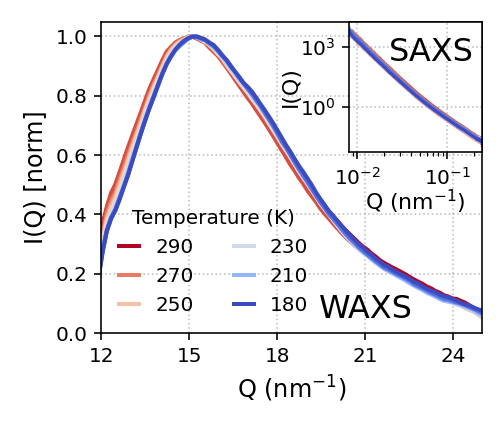

In [74]:
fig1, ax1 = plt.subplots(1,1,figsize=(3.5,3.))

# -- waxs and saxs
# waxs
ax2 = plt.axes([0,0,1,1])
ip = InsetPosition(ax1, [0.65,0.58,0.35,0.42]) #x0,y0, x_length, y_length
ax2.set_axes_locator(ip)

col = plt.cm.coolwarm_r(np.linspace(0,1,len(T)))
              
for i, (Iqi,qi) in enumerate(zip(Iq_waxs,q_waxs)):
    if i in [0,2,4,6,8,len(T)-1]:
        ax1.plot(qi, Iqi/np.max(Iqi), c=col[i], lw=2,  label=f'{T[i]}')
    else: ax1.plot(qi, Iqi/np.max(Iqi), c=col[i], lw=2)

ax1.set_ylabel('I(Q) [norm]', fontsize=12)
ax1.set_xlabel(r'Q ($\rm nm^{-1}$)', fontsize=12)
ax1.set_xticks([12,15,18,21,24,26])
# ax1.set_yticks([0.3,0.6,1])
ax1.legend(loc='lower left', title='Temperature (K)', handlelength=1, ncol=2, frameon=False)
ax1.set_xlim(12, 25)
ax1.set_ylim(0,1.05)
ax1.grid(ls=':', alpha=.5, c='gray')

# saxs
for i,ind in enumerate(inds_saxs_sorted):
    tmp = d.get_item(ind)    
    q = tmp['soq'][:,0]
    Iq = tmp['soq'][:,1]
    dIq = tmp['soq'][:,2]
    del tmp
    ax2.plot(q, Iq, c=col[i], label=T[i])

ax2.set_ylabel('I(Q)', fontsize=11, labelpad=-0.5)
ax2.set_xlabel(r'Q ($\rm nm^{-1}$)', fontsize=11, labelpad=-0.5)
ax2.set_yscale('log')
ax2.set_xscale('log')
ax2.set_xlim(q[0],q[-1])
ax2.grid(ls=':', alpha=.5, c='gray')

ax1.text(0.57,0.05,'WAXS',fontsize=16, transform=ax1.transAxes)
ax2.text(0.3,0.7,'SAXS',fontsize=16, transform=ax2.transAxes)

plt.tight_layout()
# plt.savefig('../09-plots/fig3-A.png', dpi=300)    
plt.show()

<IPython.core.display.Javascript object>


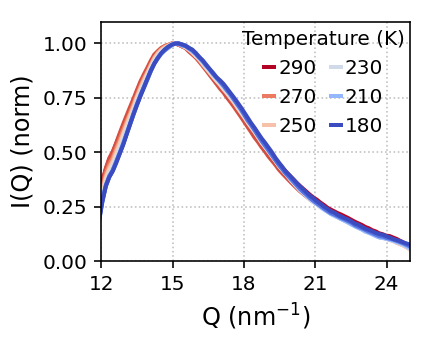

In [75]:
fig1, ax1 = plt.subplots(1,1,figsize=(3.,2.5))

# -- waxs and saxs
# waxs
col = plt.cm.coolwarm_r(np.linspace(0,1,len(T)))
              
for i, (Iqi,qi) in enumerate(zip(Iq_waxs,q_waxs)):
    if i in [0,2,4,6,8,len(T)-1]:
        ax1.plot(qi, Iqi/np.max(Iqi), c=col[i], lw=2,  label=f'{T[i]}')
    else: ax1.plot(qi, Iqi/np.max(Iqi), c=col[i], lw=2)

ax1.set_ylabel('I(Q) (norm)', fontsize=12)
ax1.set_xlabel(r'Q ($\rm nm^{-1}$)', fontsize=12)
ax1.set_xticks([12,15,18,21,24,26])
# ax1.set_yticks([0.3,0.6,1])
ax1.legend(loc=(.43,.49), title='Temperature (K)', handlelength=.5, ncol=2, 
           frameon=False, fontsize=10,columnspacing=0.7,handletextpad=0.2)
ax1.set_xlim(12, 25)
ax1.set_ylim(0,1.1)
ax1.grid(ls=':', alpha=.5, c='gray')

plt.tight_layout()
# plt.savefig('../09-plots/waxs.png', dpi=300)    
plt.show()

In [76]:
# -- save in csv 
fig2a = {'q (1/nm)': q_waxs[0]}

for i,iq in enumerate(Iq_waxs):
    key = f'Iq T={T[i]} K'
    fig2a[key] = iq
    
for key in fig2a:
    print(key, np.shape(fig2a[key]))
# create dataframe from dictionary
df2a = pd.DataFrame(fig2a)

# write csv from dataframe
df2a.to_csv('../csv/Figure2a.csv', index=False)

# load
rcsv = pd.read_csv('../csv/Figure2a.csv')
rcsv

q (1/nm) (100,)
Iq T=290 K (100,)
Iq T=280 K (100,)
Iq T=270 K (100,)
Iq T=260 K (100,)
Iq T=250 K (100,)
Iq T=240 K (100,)
Iq T=230 K (100,)
Iq T=220 K (100,)
Iq T=210 K (100,)
Iq T=200 K (100,)
Iq T=190 K (100,)
Iq T=180 K (100,)


,q (1/nm),Iq T=290 K,Iq T=280 K,Iq T=270 K,Iq T=260 K,Iq T=250 K,Iq T=240 K,Iq T=230 K,Iq T=220 K,Iq T=210 K,Iq T=200 K,Iq T=190 K,Iq T=180 K
0,11.750937,0.540371,-0.124603,-0.154685,-0.231256,-0.235331,-0.196605,-0.259141,-0.304723,-0.324935,-0.274691,-0.250797,-0.293300
1,11.896513,1.052167,0.778061,0.771278,0.739226,0.702252,0.694164,0.609261,0.585673,0.612321,0.614418,0.612241,0.604818
2,12.042089,1.278518,1.083119,1.078464,1.062941,1.025683,1.007450,0.924483,0.903957,0.925943,0.912654,0.918645,0.910019
3,12.187665,1.459290,1.298964,1.310019,1.304309,1.252185,1.227668,1.132912,1.124747,1.164845,1.133518,1.137905,1.152404
4,12.333241,1.610835,1.440290,1.448813,1.444085,1.387836,1.363112,1.270271,1.272968,1.303659,1.273943,1.276318,1.290971
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,25.580659,0.266376,0.191000,0.215028,0.229443,0.212609,0.208324,0.197403,0.191669,0.190358,0.174838,0.169896,0.179493
96,25.726235,0.226594,0.153353,0.182138,0.187559,0.185811,0.180587,0.171858,0.166298,0.171603,0.151527,0.148781,0.146209
97,25.871811,0.131002,0.088724,0.118893,0.137461,0.131843,0.135180,0.133880,0.144233,0.147526,0.130113,0.122054,0.110850
98,26.017387,-0.349807,-0.234433,-0.234101,-0.199745,-0.155784,-0.133826,-0.113056,-0.102015,-0.086336,-0.087901,-0.103943,-0.115270
